In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
import sympy as sp # 'sympy' library for symbolic calculations

# Setting the fontsize of x, y label and title of python plots globally
import matplotlib as mpl
# Set global font sizes
mpl.rcParams['axes.titlesize'] = 12      # Title font size
mpl.rcParams['axes.labelsize'] = 12      # X and Y label font size
mpl.rcParams['xtick.labelsize'] = 10     # X tick label font size
mpl.rcParams['ytick.labelsize'] = 10     # Y tick label font size
mpl.rcParams['legend.fontsize'] = 8     # Legend font size
mpl.rcParams['font.size'] = 12           # General font size (e.g. for text)
mpl.rcParams['figure.dpi'] = 300         # higher dpi = more resolution

# For Interactive window (zoom-in, zoom-out feature)
# %matplotlib widget

# Uncomment the below one high quality plots
# plots and code are in same window
%matplotlib inline  
# for clear image, can be set to 'pdf/png' format also
%config InlineBackend.figure_format = 'retina'  

#### Universal constants in SI units ( Global variable )

In [2]:
G = 6.67 * (1e-11)
pc = 3*(1e16)
c = 3*(1e8)

# Mass of Sun in Kg
M_sun = 1e30

#### Binary Masses

In [74]:
# BINARY MASSES

# Primary Mass (bigger BH)
mass_1 = (1e3)*M_sun
# Secondary Mass (smaller BH)
mass_2 = 10*M_sun
# Total mass
total_mass = mass_1 + mass_2

eta = mass_1*mass_2/(total_mass**2)

# ISCO distance
r_min = (6*G*mass_1)/(c**2)

# Conversion factors ( Geometrized units G = c = 1 )
t_factor = r_min/c        # from ISCO distance to seconds
l0 = r_min          # from ISCO distance to meters
m0 = (c**2)*r_min/G # from ISCO distance to kg

# Binary masses in ISCO distance (bcz we write DE in geometrized units ,i.e, G = c = 1)
m1 = mass_1 / m0
m2 = mass_2 / m0
M = total_mass / m0

#### Initial orbital parameters

In [4]:
# Initial eccentricity
e_i = 0.9 
# Initial value of semi-latus rectum in ISCO distance units
p_i = 100
# Initial value of omega in radians
omega_i = 0.0  
# Staring time
t_i = 0.0

# Final value of 'f' 
f_final = 1e15*(np.pi)

# Distance between binaries and observation point
R = 10 * 1e6 * pc / l0  # in ISCO units

## Elliptical binaries in Vacuum

#### Averaged Osculating equations for GW backreaction 

$ \big< \frac{de}{df} \big>_{GW} = -\frac{8}{5} \eta \frac{(GM)^{5/2}}{c^5 p^{5/2}} \big( \frac{304}{24}e+\frac{121}{24} e^3 \big) $

$ \big< \frac{dp}{df} \big>_{GW} = -\frac{8}{5} \eta \frac{(GM)^{5/2}}{c^5 p^{3/2}} (8+7 e^2)  $

$ \big< \frac{d\omega}{df} \big>_{GW} = 0 $

$ \big< \frac{dt}{df} \big>_{GW} = \sqrt{\frac{p^3}{GM}} (1- e^2)^{-3/2} $ 

Set everything in Geometrized units $ \boxed{ G = c = 1 }$

In [5]:
# Averaged osculating equations considering only GW backreaction
def osculating_eqn_gw_brxn(f,y,combination,alpha):
    e, p, omega, t = y
    # If DM gravity effect is considered then total mass should be M_eff else its just M=(m1+m2)
    if combination==2 or combination==3:
        dedf = -(8/5)*eta*(((M_eff(alpha))**(5/2))/((p**(5/2))))*( (304/24)*e + (121/24)*(e**3) )
        dpdf = -(8/5)*eta*(((M_eff(alpha))**(5/2))/((p**(3/2))))*( 8 + 7*(e**2) )
        domegadf = 0.0
        dtdf = np.sqrt((p**3)/(M_eff(alpha))) * ((1- e**2)**(-3/2))
    else:    
        dedf = -(8/5)*eta*(((M)**(5/2))/((p**(5/2))))*( (304/24)*e + (121/24)*(e**3) )
        dpdf = -(8/5)*eta*((M)**(5/2))/(((p**(3/2))))*( 8 + 7*(e**2) )
        domegadf = 0.0
        dtdf = np.sqrt((p**3)/(M)) * ((1- e**2)**(-3/2))
    return [dedf, dpdf, domegadf, dtdf]

class orbit_evolution_without_DM:
    # Initial parameters
    def __init__(self, e_i, p_i, omega_i, t_i, f_final):
        self.e_i = e_i
        self.p_i = p_i
        self.omega_i = omega_i
        self.t_i = t_i
        self.f_final = f_final
    
    # Orbit evolution considering only GW backreaction
    def orbit_evolution_gw_brxn(self):
        # Define the event function
        def stopping_condition(f, y):
            e, p, omega, t = y
            # Final value of semi-latus rectum in meters ( at ISCO )
            p_end = ( 6 + 2*self.e_i )*r_min/l0
            return p - p_end  # Integration stops when 'p' reaches ISCO distance

        # Make the event terminal and specify the direction
        stopping_condition.terminal = True    # ensures that the solver stops integration when the event is detected.
        stopping_condition.direction = 0      # allows the detection of zero crossings in any direction (i.e., both increasing and decreasing)

        # Coupled osculating equations
        def coupled_osculating_eqns(f,y):
            return osculating_eqn_gw_brxn(f,y,combination=0,alpha=0)

        # Initial conditions
        initial_conditions = [self.e_i, self.p_i, self.omega_i, self.t_i]

        f_span = (0,self.f_final)   # True anomaly 'f'

        # Solve the system using solve_ivp
        solution = solve_ivp(coupled_osculating_eqns, f_span, initial_conditions, events=stopping_condition, method='RK45',
                            atol=1e-16, rtol=1e-10, max_step=100*np.pi) # One can set max_step=100*np.pi

        # print(solution.success)
        # print(solution.status)
        print(solution.message)
        
        return solution.t, solution.y

In [6]:
sol_GW = orbit_evolution_without_DM(e_i, p_i, omega_i, t_i, f_final)

fGW, yGW = sol_GW.orbit_evolution_gw_brxn() 

A termination event occurred.


In [7]:
#----FOR GW BACKREACTION ONLY
plt.figure(figsize=(28,7))

plt.subplot(141)
plt.plot( fGW, yGW[0])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel('e', fontsize =14)
plt.yscale('log')
plt.title('GW backreaction ONLY :'+'\n' +rf'$e_i$ = {e_i}, $p_i$ = {p_i}(ISCO units), $\omega_i$ = {omega_i}')

plt.subplot(142)
plt.plot( fGW, yGW[1])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel('p ( ISCO units )', fontsize =14)
plt.yscale('log')
plt.title('GW backreaction ONLY :'+'\n' +rf'$e_i$ = {e_i}, $p_i$ = {p_i}(ISCO units), $\omega_i$ = {omega_i}')

plt.subplot(143)
plt.plot( fGW, yGW[2])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel(r'$\omega$ ( radians )', fontsize =14)
plt.title('GW backreaction ONLY :'+'\n' +rf'$e_i$ = {e_i}, $p_i$ = {p_i}(ISCO units), $\omega_i$ = {omega_i}')

#---'e' Vs 'p'
plt.subplot(144)
plt.plot( yGW[1], yGW[0])
plt.xscale('log')
plt.yscale('log')
plt.xlabel('p ( ISCO units )', fontsize =14)
plt.ylabel('e', fontsize =14)
plt.title('GW backreaction ONLY :'+'\n' +rf'$e_i$ = {e_i}, $p_i$ = {p_i}(ISCO units), $\omega_i$ = {omega_i}')

plt.show()

## Elliptical binaries in Static DM environment

#### Dark Matter density parameters

<center>    
$ \rho_{DM} (r) = 
\begin{cases} 
\rho_{sp} \big( \frac{r_{sp}}{r} \big)^{\alpha} &  r_{min} \leq r \leq r_{sp} \\
0 &  r \leq r_{min} \\
\end{cases} $
</center>    

where, for given primary IMBH of mass $10^3 M_{\odot}$, $r_{sp}=0.54pc$, $\rho_{sp} = 226 M_{\odot} / pc^3$ and $r_{min} = r_{ISCO} = 3R_s = 6G m_1/c^2$

In [8]:
# DARK-MATTER MINISPIKE Profile parameters

alpha = 2.25 # DM exponent
rho_sp = (226*M_sun/((pc)**3))*(l0**3 / m0)  # in ISCO units
r_sp = 0.54 * (pc) / l0   # in ISCO units

# FF is needed for DM minispike gravity force ( put FF = 0 to check the Favata result )
def FF(alpha):
    return 4*(np.pi)*(rho_sp)*((r_sp)**alpha )/(3-alpha) 

# Effective mass M_eff needed for DM effect contribution ( DM gravity, DF, Accretion ). 
# For GW backreaction only, we consider total mass M instead
def M_eff(alpha):
    rmin = r_min/l0 # it is basically equal to 1, since everything is in ISCO units
    return (m1 + m2) - (( 4*(np.pi)*(rho_sp)*((r_sp)**alpha)*((rmin)**(3-alpha)) )/(3-alpha))

I_v = 3    # Dynamical friction factor
lamda = 1  # Accretion factor

#### Averaged Osculating equations for (DF + Accretion) as perturbation 

$ \big< \frac{de}{df} \big>_{DFacc} = - \frac{4 m_2 \rho_{sp} (r_{sp})^{\alpha} (I_v + \lambda) }{M^2} p^{3-\alpha} \mathcal{f} (e) $

$ \big< \frac{dp}{df} \big>_{DFacc} = - \frac{4 m_2 \rho_{sp} (r_{sp})^{\alpha} (I_v + \lambda) }{M^2} p^{4-\alpha} \mathcal{g} (e) $

where,

$ \mathcal{f} (e) = \int_{0}^{2\pi} \frac{(\cos{f} +e)}{(1+2e \cos{f} +e^2)^{3/2}(1+e\cos{f})^{2-\alpha}} df $

$ \mathcal{g} (e) = \int_{0}^{2\pi} \frac{1}{(1+2e \cos{f} +e^2)^{3/2}(1+e\cos{f})^{2-\alpha}} df $

$$ $$

$ \big< \frac{d\omega}{df} \big>_{DFacc} = 0 $

$ \big< \frac{dt}{df} \big>_{DFacc} = \sqrt{\frac{p^3}{GM}} (1-e^2)^{-3/2} $ 


#### Averaged Osculating equations for DM Minispike gravity as perturbation 

$ \big< \frac{de}{df} \big>_{DM} = - \frac{p^{3-\alpha} F}{M_{eff}} \int_{0}^{2\pi} \frac{1}{2\pi} \frac{\sin{f}}{(1+e \cos{f})^{3-\alpha}} df $

$ \big< \frac{dp}{df} \big>_{DM} = 0 $

$ \big< \frac{d\omega}{df} \big>_{DM} = \frac{p^{3-\alpha} F}{M_{eff}} \int_{0}^{2\pi} \frac{1}{2\pi} \frac{\cos{f}}{e(1+e \cos{f})^{3-\alpha}} df $

$ \big< \frac{dt}{df} \big>_{DM} = \sqrt{\frac{p^3}{G M_{eff}}} \int_{0}^{2\pi} \frac{1}{2\pi} \frac{1}{(1+e \cos{f})^2} \big[ 1 + \frac{p^{3-\alpha} F \cos{f}}{M_{eff} e (1+ e \cos{f})^{3-\alpha}} \big] df $ 

Let

$ func1 =  \frac{1}{2\pi} \frac{\sin{f}}{(1+e \cos{f})^{3-\alpha}}  $

$ func2 =  \frac{1}{2\pi} \frac{\cos{f}}{e(1+e \cos{f})^{3-\alpha}} $

$ func3 =  \frac{1}{2\pi} \frac{1}{(1+e \cos{f})^2} \big[ 1 + \frac{p^{3-\alpha} F \cos{f}}{M_{eff} e (1+ e \cos{f})^{3-\alpha}} \big]  $

Set everything in Geometrized units $ \boxed{ G = c = 1 }$

In [9]:
from scipy.integrate import simpson

# Averaged osculating equations considering only ( DF + Accretion )
def osculating_eqn_DF_accretion(f, y, alpha, combination):
    e, p, omega, t = y
    
    x = np.linspace(0, 2*np.pi, 1000)
    fx = (np.cos(x) + e)/((1 + 2*e* np.cos(x) + e**2 )**(3/2) * (1 + e* np.cos(x))**(2-alpha) )
    f_e = simpson(fx, x)
    
    gx = 1/( ((1 + 2*e* np.cos(x) + e**2 )**(3/2)) * ((1 + e* np.cos(x))**(2-alpha)) )
    g_e = simpson(gx, x)
    
    # If DM gravity effect is also considered then total mass should be M_eff else its just M=(m1+m2)
    if combination==3:
        dedf = -( ( 4*m2*rho_sp*(r_sp**alpha)*( I_v + lamda ))*(p**(3-alpha))/(M_eff(alpha)**2) )*f_e
        dpdf = -( ( 4*m2*rho_sp*(r_sp**alpha)*( I_v + lamda ))*(p**(4-alpha))/(M_eff(alpha)**2) )*g_e
        domegadf = 0.0
        dtdf = ( np.sqrt( (p**3)/(M_eff(alpha)) ) )*( (1 - e**2)**(-3/2) )
    else:    
        dedf = -( ( 4*m2*rho_sp*(r_sp**alpha)*( I_v + lamda ))*(p**(3-alpha))/(M**2) )*f_e
        dpdf = -( ( 4*m2*rho_sp*(r_sp**alpha)*( I_v + lamda ))*(p**(4-alpha))/(M**2) )*g_e
        domegadf = 0.0
        dtdf = ( np.sqrt( (p**3)/(M) ) )*( (1 - e**2)**(-3/2) ) 
    return [dedf, dpdf, domegadf, dtdf]

# Averaged osculating equations considering only DM gravity
def osculating_eqn_DM_gravity(f, y, alpha):
    e, p, omega, t = y
    
    x = np.linspace(0, 2*np.pi, 1000)
    f1x = (1/(2*np.pi))*(np.sin(x))/( ( 1 + e*np.cos(x) )**(3-alpha) )
    f1_e = simpson(f1x, x)
    
    f2x = (1/(2*np.pi))*(np.cos(x))/( e*( 1 + e*np.cos(x) )**(3-alpha) )
    f2_e = simpson(f2x, x)
    
    f3x = (1/(2*np.pi))*(1/( 1 + e*np.cos(x) )**2 )*( 1 + 
                                                      ( p**(3-alpha))*FF(alpha)*np.cos(x) / 
                                                      ( M_eff(alpha)*e*((1+e*np.cos(x))**(3-alpha)) )  )
    f3_e = simpson(f3x, x)
    
    dedf = -( ((p**(3-alpha))*FF(alpha)) / M_eff(alpha) )*f1_e
    dpdf = 0.0
    domegadf = ( ((p**(3-alpha))*FF(alpha)) / M_eff(alpha) )*f2_e
    dtdf = ( np.sqrt((p**3)/(M_eff(alpha))) )*f3_e
    return [dedf, dpdf, domegadf, dtdf]

class orbit_evolution_with_DM(orbit_evolution_without_DM):
    # Initial parameters
    def __init__(self, e_i, p_i, omega_i, t_i, f_final, alpha):
        super().__init__(e_i, p_i, omega_i, t_i, f_final)
        self.alpha = alpha
        
    # Orbit evolution
    def orbit_evolution_DM_effect_gw_brxn(self, combination):
        # Define the event function
        def stopping_condition(f, y):
            e, p, omega, t = y
            # Final value of semi-latus rectum in meters ( at ISCO )
            p_end = ( 6 + 2*self.e_i )*r_min/l0
            return p - p_end  # Integration stops when 'p' reaches ISCO distance

        # Make the event terminal and specify the direction
        stopping_condition.terminal = True    # ensures that the solver stops integration when the event is detected.
        stopping_condition.direction = 0      # allows the detection of zero crossings in any direction (i.e., both increasing and decreasing)
        
        # Initial conditions
        initial_conditions = [self.e_i, self.p_i, self.omega_i, self.t_i]

        f_span = (0,self.f_final)   # True anomaly 'f'
        
        # Coupled osculating equations for NET effect ( DF + Accretion + DM gravity + GW brxn )
        def coupled_osculating_eqns(f, y):
            return np.add.reduce([osculating_eqn_gw_brxn(f, y, combination, self.alpha), 
                                  osculating_eqn_DF_accretion(f, y, self.alpha, combination), 
                                  osculating_eqn_DM_gravity(f, y, self.alpha)])

        # Solve the system using solve_ivp
        solution = solve_ivp(coupled_osculating_eqns, f_span, initial_conditions, events=stopping_condition, method='RK45', 
                             atol=1e-16, rtol=1e-10, max_step=100*np.pi) # One can set max_step=100*np.pi

        # print(solution.success)
        # print(solution.status)
        print(solution.message)
        
        return solution.t, solution.y

In [10]:
sol = orbit_evolution_with_DM(e_i, p_i, omega_i, t_i, f_final, alpha)

# For NET effect set combination = 3
f_NET, y_NET = sol.orbit_evolution_DM_effect_gw_brxn(3)

A termination event occurred.


In [11]:
#----For NET effect
plt.figure(figsize=(28,7))

plt.subplot(141)
plt.plot( f_NET, y_NET[0])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel('e', fontsize =14)
plt.yscale('log')
plt.title('NET effect:'+'\n'+rf'$e_i$ = {e_i}, $p_i$ = {p_i}(ISCO units), $\omega_i$ = {omega_i}')

plt.subplot(142)
plt.plot( f_NET, y_NET[1])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel('p ( ISCO units )', fontsize =14)
plt.yscale('log')
plt.title('NET effect:'+'\n'+rf'$e_i$ = {e_i}, $p_i$ = {p_i}(ISCO units), $\omega_i$ = {omega_i}')

plt.subplot(143)
plt.plot( f_NET, y_NET[2])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel(r'$\omega$ ( radians )', fontsize =14)
plt.title('NET effect:'+'\n'+rf'$e_i$ = {e_i}, $p_i$ = {p_i}(ISCO units), $\omega_i$ = {omega_i}')

#----'e' Vs 'p'
plt.subplot(144)
plt.plot( y_NET[1], y_NET[0])
plt.xscale('log')
plt.yscale('log')
plt.xlabel('p ( ISCO units )', fontsize =14)
plt.ylabel('e', fontsize =14)
plt.title('NET effect:'+'\n'+rf'$e_i$ = {e_i}, $p_i$ = {p_i}(ISCO units), $\omega_i$ = {omega_i}')

plt.show()

## Elliptical: Nonlinear GW memory

#### Perturbed kepler equation of motion 

The perurbed Newtonian binary we are setting up is (or say perturbed Kepler e.o.m ) -

$ \ddot{r} = r \dot{\phi}^2 - G \frac{m}{r^2} - G \frac{F}{r^{\alpha -1}} - G^2 \frac{4\pi m_2 \rho_{DM} (I_v + \lambda) \dot{r}}{v^3} $

$ \ddot{\phi} = - \frac{2 \dot{r} \dot{\phi}}{r} - G^2 \frac{4\pi m_2 \rho_{DM} (I_v + \lambda) \dot{\phi}}{v^3} $

And, 

$ \dot{r} = \sqrt{\frac{Gm}{p}} e \sin{f} $

$ \dot{f} = \dot{\phi} = \sqrt{\frac{Gm}{p^3}}(1 + e \cos{f} )^2 $

$ v = \sqrt{ {\dot{r}}^2 + r^2 {\dot{\phi}}^2}$

And,

$  m = M_{eff} = M - \frac{4\pi \rho_{sp} {r_{sp}}^{\alpha} {r_{min}}^{\alpha}}{(3-\alpha)}$

$ M = m_1 + m_2 $ 

Set everything in Geometrized units $ \boxed{ G = c = 1 }$

In [12]:
# SYMBOLIC CALCULATIONS

# Declare constants
m_, eta_, F_, alpha_, m2_, rho_sp_, r_sp_, Iv_, lamda_ = sp.symbols('m eta F alpha m2 rho_sp r_sp Iv lamda')

# Declare independent variable time as symbol
t_ = sp.symbols('t')

# Declare time-dependent functions
r_ = sp.Function('r')(t_)
phi_ = sp.Function('phi')(t_)
drdt_ = sp.Function('drdt')(t_) 
dphidt_ = sp.Function('dphidt')(t_)

# Declare time derivatives of 'r' and 'phi' as symbols 
r_dot_, r_dotdot_, r_dotdotdot_, phi_dot_, phi_dotdot_, phi_dotdotdot_ = sp.symbols('r_dot, r_dotdot, r_dotdotdot, phi_dot, phi_dotdot, phi_dotdotdot')

# Define expressions for velocity 'v'
v_ = sp.sqrt( drdt_**2 + (r_**2) * (dphidt_**2) )

# Define expression for DM minispike density
rho_dm_ = rho_sp_ * ((r_sp_/r_)**alpha_)

# Elliptical : Perturbed Newtonian binary e.o.m
d2rdt2_ = (r_*(dphidt_**2)) - (m_/(r_**2)) - (F_/(r_**(alpha_-1))) - (4*sp.pi*m2_*rho_dm_*(Iv_+lamda_)*drdt_/(v_**3))
d2phidt2_ = -((2*drdt_*dphidt_)/r_) - (4*sp.pi*m2_*rho_dm_*(Iv_+lamda_)*dphidt_/(v_**3))

# 3rd-time derivative of 'r' and 'phi'
d3rdt3_ = sp.simplify(sp.diff(d2rdt2_, t_))
d3phidt3_ = sp.simplify(sp.diff(d2phidt2_, t_))

# Substitute 'r' and 'phi' time derivatives as symbols
d3rdt3 = d3rdt3_.subs({
    sp.Derivative(r_, t_): r_dot_,
    drdt_ : r_dot_,
    sp.Derivative(drdt_, t_): r_dotdot_,
    sp.Derivative(phi_, t_): phi_dot_,
    dphidt_ : phi_dot_,
    sp.Derivative(dphidt_, t_): phi_dotdot_})

d3phidt3 = d3phidt3_.subs({
    sp.Derivative(r_, t_): r_dot_,
    drdt_ : r_dot_,
    sp.Derivative(drdt_, t_): r_dotdot_,
    sp.Derivative(phi_, t_): phi_dot_,
    dphidt_ : phi_dot_,
    sp.Derivative(dphidt_, t_): phi_dotdot_})

# Print to check derivatives were done correctly
# print(f'd3rdt3 = {sp.simplify(d3rdt3)}') 
# print(f'd3phidt3 = {sp.simplify(d3phidt3)}')
 
# Create numerical function of 3rd-time derivative of 'r' and 'phi'
r_dotdotdot_func = sp.lambdify((r_, r_dot_, r_dotdot_, phi_dot_, phi_dotdot_,
                                m_, F_, alpha_, m2_, rho_sp_, r_sp_, Iv_, lamda_), d3rdt3, modules='numpy')
phi_dotdotdot_func = sp.lambdify((r_, r_dot_, r_dotdot_, phi_dot_, phi_dotdot_,
                                  m_, F_, alpha_, m2_, rho_sp_, r_sp_, Iv_, lamda_), d3phidt3, modules='numpy')

i = 1j # complex number

# Define the expression for Mass-quadrupole moments
I20_ = -4 * sp.sqrt(sp.pi / 15) * eta_ * m_ * r_**2
I22P_ = 2 * sp.sqrt(2*sp.pi/5) * eta_ * m_ * r_**2 * sp.exp(-2*i*phi_)
I22M_ = 2 * sp.sqrt(2*sp.pi/5) * eta_ * m_ * r_**2 * sp.exp( 2*i*phi_)

# 3rd-time derivative of Mass-qudrupole moments
I20ddd_  = sp.simplify(sp.diff(I20_, t_, 3))
I22Pddd_ = sp.simplify(sp.diff(I22P_, t_, 3))
I22Mddd_ = sp.simplify(sp.diff(I22M_, t_, 3))

# Substitute 'r' and 'phi' time derivatives as symbols
I20ddd = I20ddd_.subs({
    sp.Derivative(r_, t_): r_dot_,
    sp.Derivative(r_, t_, 2): r_dotdot_,
    sp.Derivative(r_, t_, 3): r_dotdotdot_,
    sp.Derivative(phi_, t_): phi_dot_,
    sp.Derivative(phi_, t_, 2): phi_dotdot_,
    sp.Derivative(phi_, t_, 3): phi_dotdotdot_})

I22Pddd = I22Pddd_.subs({
    sp.Derivative(r_, t_): r_dot_,
    sp.Derivative(r_, t_, 2): r_dotdot_,
    sp.Derivative(r_, t_, 3): r_dotdotdot_,
    sp.Derivative(phi_, t_): phi_dot_,
    sp.Derivative(phi_, t_, 2): phi_dotdot_,
    sp.Derivative(phi_, t_, 3): phi_dotdotdot_})

I22Mddd = I22Mddd_.subs({
    sp.Derivative(r_, t_): r_dot_,
    sp.Derivative(r_, t_, 2): r_dotdot_,
    sp.Derivative(r_, t_, 3): r_dotdotdot_,
    sp.Derivative(phi_, t_): phi_dot_,
    sp.Derivative(phi_, t_, 2): phi_dotdot_,
    sp.Derivative(phi_, t_, 3): phi_dotdotdot_})

# Print to check derivatives were done correctly
# print(f'I20ddd = {sp.simplify(I20ddd)}') 
# print(f'I22Pddd = {sp.simplify(I22Pddd)}') 
# print(f'I22Mddd = {sp.simplify(I22Mddd)}') 

# Create numerical function of 3rd-time derivative of quadrupole moments
I20ddd_func  = sp.lambdify((r_, phi_, r_dot_, r_dotdot_, r_dotdotdot_, phi_dot_, phi_dotdot_, phi_dotdotdot_, m_, eta_), 
                           I20ddd, modules='numpy')
I22Pddd_func = sp.lambdify((r_, phi_, r_dot_, r_dotdot_, r_dotdotdot_, phi_dot_, phi_dotdot_, phi_dotdotdot_, m_, eta_), 
                           I22Pddd, modules='numpy')
I22Mddd_func = sp.lambdify((r_, phi_, r_dot_, r_dotdot_, r_dotdotdot_, phi_dot_, phi_dotdot_, phi_dotdotdot_, m_, eta_), 
                           I22Mddd, modules='numpy')

In [13]:
# Relative distance between binaries
def rel_distance(y, f):
    e, p, omega, t = y
    return p/( 1 + e*np.cos(f) )

def r_dot(y, f, alpha, combination):
    e, p, omega, t = y
    if combination==0 or combination==1 or combination==11:
        m = M
    else:
        m = M_eff(alpha)
    return np.sqrt(m/p) * e * np.sin(f)

def phi_dot(y, f, alpha, combination):
    e, p, omega, t = y
    if combination==0 or combination==1 or combination==11:
        m = M
    else:
        m = M_eff(alpha)
    return np.sqrt( (m)/(p**3) ) * ( 1 + e * np.cos(f) )**2 

# Define function for relative velocity
def v(y, f, alpha, combination):
    return np.sqrt( (r_dot(y, f, alpha, combination))**2 + ( rel_distance(y, f) * phi_dot(y, f, alpha, combination) )**2 )

# Define function for DM minispike density
def rho_dm(y, f, alpha):
    return rho_sp * (r_sp/rel_distance(y, f))**alpha

# Elliptical : Perturbed Newtonian binary 
def r_dotdot(y, f, alpha, F, combination): # Radial e.o.m
    r = rel_distance(y, f)
    rdot = r_dot(y, f, alpha, combination)
    phidot = phi_dot(y, f, alpha, combination)
    velocity = v(y, f, alpha, combination)
    if combination==0:
        rhodm = 0
        m = M
    else:
        rhodm = rho_dm(y, f, alpha)
        m = M_eff(alpha)
    return r * phidot**2 - (m)/(r**2) - (F)/(r**(alpha-1)) - 4 * np.pi * m2 * rhodm * (I_v+lamda) * rdot/velocity**3
    
def phi_dotdot(y, f, alpha, F, combination): # Azimuthal angle e.o.m
    r = rel_distance(y, f)
    rdot = r_dot(y, f, alpha, combination)
    phidot = phi_dot(y, f, alpha, combination)
    velocity = v(y, f, alpha, combination)
    if combination==0:
        rhodm = 0
        m = M
    else:
        rhodm = rho_dm(y, f, alpha)
        m = M_eff(alpha)
    return -2*rdot*phidot/r - 4 * np.pi * m2 * rhodm * (I_v+lamda) * phidot/velocity**3

def dh20dt_mem(y, f, R, alpha, F, combination):
    r = rel_distance(y, f)
    rdot = r_dot(y, f, alpha, combination)
    rdotdot = r_dotdot(y, f, alpha, F, combination)
    phidot = phi_dot(y, f, alpha, combination)
    phidotdot = phi_dotdot(y, f, alpha, F, combination)
    
    if combination==0: # Switch OFF all DM environment effects i.e we observe just GW backrxn effect
        F = 0
        rhosp = 0
        m = M
    if combination==1 or combination==11: # Switch OFF DM minispike gravity only i.e we observe (DF + GW backrxn)
        F = 0
        rhosp = rho_sp
        m = M
    else: # Switch ON all DM environment effects + GW backrxn
        F = FF(alpha)
        rhosp = rho_sp
        m = M_eff(alpha)

    rdotdotdot = r_dotdotdot_func(r, rdot, rdotdot, phidot, phidotdot, m, F, alpha, m2, rhosp, r_sp, I_v, lamda)
    phidotdotdot = phi_dotdotdot_func(r, rdot, rdotdot, phidot, phidotdot, m, F, alpha, m2, rhosp, r_sp, I_v, lamda)

    h20dotN =  I20ddd_func(r, f, rdot, rdotdot, rdotdotdot, phidot, phidotdot, phidotdotdot, M, eta )/(R * np.sqrt(2))
    h22PdotN = I22Pddd_func(r, f, rdot, rdotdot, rdotdotdot, phidot, phidotdot, phidotdotdot, M, eta)/(R * np.sqrt(2))
    h22MdotN = I22Mddd_func(r, f, rdot, rdotdot, rdotdotdot, phidot, phidotdot, phidotdotdot, M, eta)/(R * np.sqrt(2))
    h22dotN = (np.abs( h22PdotN * h22MdotN ))**(1/2)

    return (R/42)*(np.sqrt(15/(2*np.pi)))*( 2 * (h22dotN**2) - (h20dotN**2) )
    

def dh40dt_mem(y, f, R, alpha, F, combination):
    r = rel_distance(y, f)
    rdot = r_dot(y, f, alpha, combination)
    rdotdot = r_dotdot(y, f, alpha, F, combination)
    phidot = phi_dot(y, f, alpha, combination)
    phidotdot = phi_dotdot(y, f, alpha, F, combination)
    
    if combination==0: # Switch OFF all DM environment effects i.e we observe just GW backrxn effect
        F = 0
        rhosp = 0
        m = M
    if combination==1 or combination==11: # Switch OFF DM minispike gravity only i.e we observe (DF + GW backrxn)
        F = 0
        rhosp = rho_sp
        m = M
    else: # Switch ON all DM environment effects + GW backrxn
        F = FF(alpha)
        rhosp = rho_sp
        m = M_eff(alpha)

    rdotdotdot = r_dotdotdot_func(r, rdot, rdotdot, phidot, phidotdot, m, F, alpha, m2, rhosp, r_sp, I_v, lamda)
    phidotdotdot = phi_dotdotdot_func(r, rdot, rdotdot, phidot, phidotdot, m, F, alpha, m2, rhosp, r_sp, I_v, lamda)

    h20dotN =  I20ddd_func(r, f, rdot, rdotdot, rdotdotdot, phidot, phidotdot, phidotdotdot, M, eta )/(R * np.sqrt(2))
    h22PdotN = I22Pddd_func(r, f, rdot, rdotdot, rdotdotdot, phidot, phidotdot, phidotdotdot, M, eta)/(R * np.sqrt(2))
    h22MdotN = I22Mddd_func(r, f, rdot, rdotdot, rdotdotdot, phidot, phidotdot, phidotdotdot, M, eta)/(R * np.sqrt(2))
    h22dotN = (np.abs( h22PdotN * h22MdotN ))**(1/2)

    return (R/1260)*(np.sqrt(5/(2*np.pi)))*( (h22dotN**2) + 3 * (h20dotN**2) )

# Averaging h20 mode of nonlinear memory over one time period
def integrand_h20(y, f, R, alpha, F, combination):
    e, p, omega, t = y
    func_f = dh20dt_mem(y, f, R, alpha, F, combination)
    return func_f/( 1 + e * np.cos(f) )**2

# Averaging h40 mode of nonlinear memory over one time period
def integrand_h40(y, f, R, alpha, F, combination):
    e, p, omega, t = y
    func_f = dh40dt_mem(y, f, R, alpha, F, combination)
    return func_f/( 1 + e * np.cos(f) )**2 

# Calculating hl0 (l = 2, 4) mode of Nonlinear memory
class calculate_nonlinear_memory(orbit_evolution_with_DM):
    # Initial parameters
    def __init__(self, e_i, p_i, omega_i, t_i, f_final, alpha, R):
        super().__init__(e_i, p_i, omega_i, t_i, f_final, alpha)
        self.R = R
        
    def cal_hl0(self, F, combination): 
        sol_without_DM = orbit_evolution_without_DM(self.e_i, self.p_i, self.omega_i, self.t_i, self.f_final)
        sol_with_DM = orbit_evolution_with_DM(self.e_i, self.p_i, self.omega_i, self.t_i, self.f_final, self.alpha)
        
        if combination==0: # GW backrxn only ( FAVATA result )
            f, y = sol_without_DM.orbit_evolution_gw_brxn()
        else: # NET : DF + Accretion + DM gravity + GW backrxn
            f, y = sol_with_DM.orbit_evolution_DM_effect_gw_brxn(3)

        e, p, omega, t = y
        num = len(e)

        # Calculating average dh20dt_mem and dh40dt_mem wrt true anomaly 
        avg_dh20dt_mem = []
        avg_dh40dt_mem = []

        for i in range(num):
            fdash = np.linspace(0,2*np.pi,1000) 
            # For h20 mode
            g_e1 = integrand_h20(y[:,i], fdash, self.R, self.alpha, F, combination)
            avg_dh20dt_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e1, fdash)) # Integrating using Simpson's rule
            # For h40 mode
            g_e2 = integrand_h40(y[:,i], fdash, self.R, self.alpha, F, combination)
            avg_dh40dt_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e2, fdash)) # Integrating using Simpson's rule

        avg_dh20dt_mem = np.array(avg_dh20dt_mem)
        avg_dh40dt_mem = np.array(avg_dh40dt_mem)

        avg_dh20de_mem = []
        avg_dh40de_mem = []

        for i in range(num):
            if combination==0: # GW backrxn only ( FAVATA result )
                dedf, dpdf, domegadf, dtdf = osculating_eqn_gw_brxn(f[i], y[:,i], combination, self.alpha)
                avg_dh20de_mem.append( avg_dh20dt_mem[i] * dtdf / dedf ) 
                avg_dh40de_mem.append( avg_dh40dt_mem[i] * dtdf / dedf ) 
            else: # NET : DF + Accretion + DM gravity + GW backrxn
                dedf, dpdf, domegadf, dtdf = np.add.reduce([osculating_eqn_gw_brxn(f[i],y[:,i],combination,self.alpha),
                                               osculating_eqn_DF_accretion(f[i], y[:,i], self.alpha, combination),
                                               osculating_eqn_DM_gravity(f[i], y[:,i], self.alpha)])
                avg_dh20de_mem.append( avg_dh20dt_mem[i] * dtdf / dedf )
                avg_dh40de_mem.append( avg_dh40dt_mem[i] * dtdf / dedf )

        # Calculating h20_mem and h40_mem as function of eccentricity using Euler's method
        h20_mem = np.zeros((np.shape(e))) 
        h40_mem = np.zeros((np.shape(e))) 

        for j in range(num-1):
            # Euler method
            h20_mem[j+1] = h20_mem[j] + avg_dh20de_mem[j] * ( e[j+1] - e[j] ) 
            h40_mem[j+1] = h40_mem[j] + avg_dh40de_mem[j] * ( e[j+1] - e[j] ) 

        return f, y, h20_mem, h40_mem

In [14]:
# Calculating Nonlinear GW memory for given initial orbital parameters
nonlinear_memory = calculate_nonlinear_memory(e_i, p_i, omega_i, t_i, f_final, alpha, R)

# Only GW breaction ( FAVATA result )
fgw, ygw, h20_mem_gw, h40_mem_gw = nonlinear_memory.cal_hl0(F=0, combination=0)

print('h20_mem_gw = ',h20_mem_gw[-1])
print('h40_mem_gw = ',h40_mem_gw[-1])

# NET : DM gravity + DF + Accretion + GW brxn
f_net, y_net, h20_mem_NET, h40_mem_NET = nonlinear_memory.cal_hl0(F=FF(alpha), combination=3)

print('h20_mem_NET = ',h20_mem_NET[-1])
print('h40_mem_NET = ',h40_mem_NET[-1])

A termination event occurred.
h20_mem_gw =  4.798586134230353e-22
h40_mem_gw =  4.6275775909158875e-24
A termination event occurred.
h20_mem_NET =  1.3960662352978258e-21
h40_mem_NET =  1.352091929019076e-23


In [15]:
# FOR - Only GW breaction ( FAVATA result ) : Save the array
np.save("ellip_fgw.npy", fgw)
np.save("ellip_ygw.npy", ygw)
np.save("ellip_h20_mem_gw.npy", h20_mem_gw)
np.save("ellip_h40_mem_gw.npy", h40_mem_gw)

# FOR - Spike NET effect : Save the array
np.save("ellip_spike_f_net.npy", f_net)
np.save("ellip_spike_y_net.npy", y_net)
np.save("ellip_spike_h20_mem_NET.npy", h20_mem_NET)
np.save("ellip_spike_h40_mem_NET.npy", h40_mem_NET)
%store alpha

Stored 'alpha' (float)


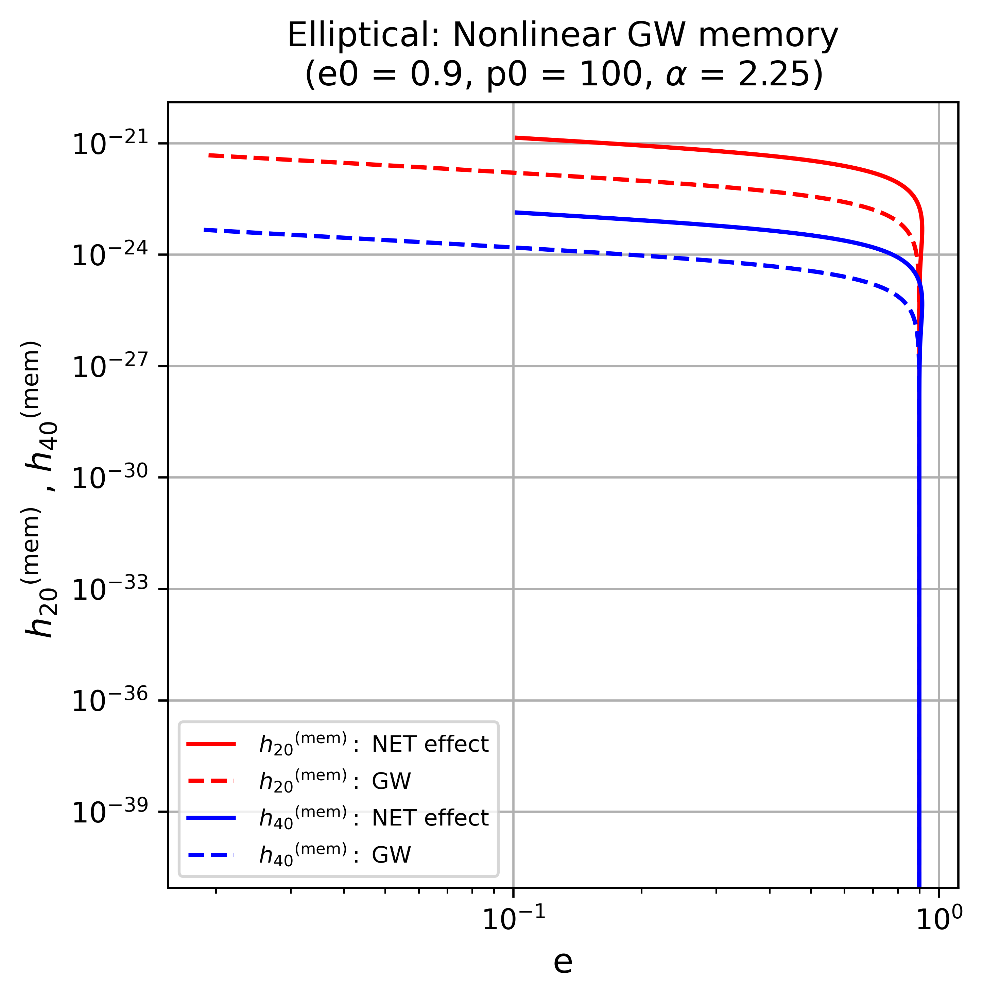

In [16]:
# Plotting
plt.figure(figsize=(5,5))
plt.title('Elliptical: Nonlinear GW memory' + "\n" + f'(e0 = {e_i}, p0 = {p_i}, '+r'${{\alpha}}$' +f' = {alpha})')

plt.plot( y_net[0,:], h20_mem_NET, label = r' ${h_{20}}^{\text{(mem)}}:$' +' NET effect', linestyle='-', color='red' )
plt.plot( ygw[0,:], h20_mem_gw, label= r' ${h_{20}}^{\text{(mem)}}: $' + ' GW', linestyle='--', color='red')

plt.plot( y_net[0,:], h40_mem_NET, label = r' ${h_{40}}^{\text{(mem)}}:$' + ' NET effect', linestyle='-', color='blue' )
plt.plot( ygw[0,:], h40_mem_gw, label= r' ${h_{40}}^{\text{(mem)}}:$' + ' GW', linestyle='--', color='blue')

plt.xlabel('e')
plt.ylabel(r' ${h_{20}}^{\text{(mem)}}$ , ${h_{40}}^{\text{(mem)}}$')
plt.xscale('log')
plt.yscale('log')
plt.legend(loc='lower left')
plt.grid(True)

# Save as PDF
plt.savefig("elliptical_spike_plot_1.pdf", format="pdf", bbox_inches="tight")

plt.show()

#### Nonlinear memory GW strain $h^{\text{(mem)}}(f)$  Vs frequency

$ h^{\text{(mem)}}(f) = \sqrt{ |h_{+}^{(mem)}(f)|^2 + |h_{\times}^{(mem)}(f)|^2 } $

##### Nonlinear memory GW polarization

The polarization for the non-linear memory waves for bound **elliptical orbits** computed by summing the $m =0$ modes -

$ {h_{+}}^{(mem)} ( e, \Theta ) = \frac{1}{8} \sqrt{\frac{30}{\pi}} {\sin}^2{\Theta} \Big[ {h_{20}}^{\text{(mem)}} + \frac{\sqrt{3}}{2} {h_{40}}^{\text{(mem)}}(7 {\cos}^2{\Theta} -1)  \Big]$

$ {h_{\times}}^{(mem)} ( e, \Theta ) = 0 $

Let $\Theta = \frac{\pi}{3} $

In [17]:
# Plus polarization of GW nonlinear memory
def hplus_mem(h20mem,h40mem,theta):
        return (1/8)*np.sqrt(30/np.pi) * ((np.sin(theta))**2)*( h20mem + np.sqrt(3/4) * h40mem*( 7*((np.cos(theta))**2) -1 ) )

# Noise spectral density of LISA
def LISA_noise_psd(f_without_DM, f_with_DM):
    if len(f_without_DM) >= len(f_with_DM):
        frq = f_without_DM
    else:
        frq = f_with_DM
    
    Sh_inst = 9.18e-52 * frq**(-4) + 1.59e-41 + 9.18e-38 * (frq**2)
    Sh_gal = 2.1e-45 * (frq**(-7/3))
    Sh_exgal = 4.2e-47 * (frq**(-7/3))
    mission = 1.5/(3600*24*365) # taken 1.5 per year
    dNdf = 2e-3 * (frq**(-11/3))
    
    deno = np.exp(-mission*dNdf)
    # Get the smallest positive number that can be differentiated from zero
    epsilon = 1e-16
    if np.any(deno==0):
        deno[ deno == 0 ] = epsilon
    
    return frq, np.sqrt(np.minimum(( Sh_inst/deno ) + Sh_exgal, Sh_inst + Sh_gal + Sh_exgal))

# Noise spectral density of GWSat
def GWSat_noise_psd(f_without_DM, f_with_DM):
    if len(f_without_DM) >= len(f_with_DM):
        frq = f_without_DM
    else:
        frq = f_with_DM
    return frq, np.sqrt( ( 1e-25 * frq**(-2) + 1e-23 + 1e-24 * frq**(-1))**2 )

# Nonlinear memory GW polarization FFT
def nonlinear_memory_gw_pol_fft(h20mem, h40mem):
    theta = np.pi/3
    # Nonlinear memory GW polarization time signal 
    hplus_t_mem = hplus_mem(h20mem,h40mem,theta)
    # Fourier transform
    hplus_f_mem = np.fft.fft(hplus_t_mem) 
    freq = np.fft.fftfreq(len(hplus_f_mem))
    # selecting only positive frequencies
    l = len(freq[freq>0]) 
    # Nonlinear memory GW polarization frequency signal 
    hp_f_mem = np.abs(hplus_f_mem[1:l])
    pos_freq = freq[1:l]
    return hp_f_mem, pos_freq

In [18]:
# Load the Strain sensitivity of various GW detectors
CE_data = np.loadtxt('cosmic_explorer_40km_lf_strain.txt')         # Cosmic explorer data
ET_data = np.loadtxt('ET-0002A-18_ETBSensitivityCurveTxtFile.txt') # Einstein telescope low frequency data
aLIGO_data = np.loadtxt('aLIGODesign.txt')

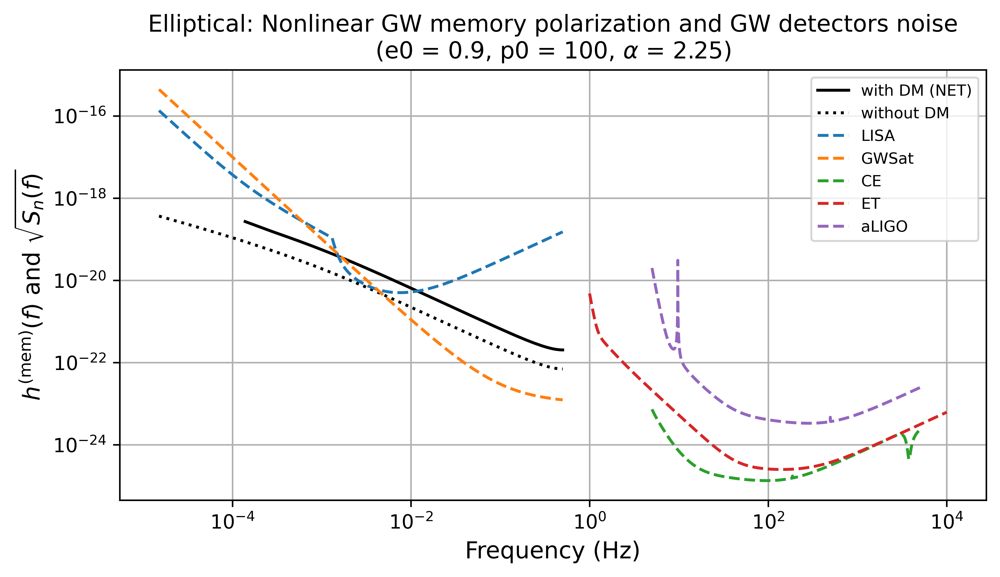

In [19]:
# Nonlinear memory GW polarization frequency signal without DM (Only GW backrxn)
hp_f_mem_without_DM, pos_freq_without_DM = nonlinear_memory_gw_pol_fft(h20_mem_gw, h40_mem_gw)

# Nonlinear memory GW polarization frequency signal with DM (NET Effect)
hp_f_mem_with_DM_NET, pos_freq_with_DM_NET = nonlinear_memory_gw_pol_fft(h20_mem_NET, h40_mem_NET)

# GW detectors noise spectrum : Split into frequency and noise strain
CE_frequency = CE_data[:, 0] # Cosmic explorer
CE_strain = CE_data[:, 1]
ET_frequency = ET_data[:, 0] # Einstein telescope
ET_strain = ET_data[:, 1]
aLIGO_frequency = aLIGO_data[:, 0]  # Advanced LIGO
aLIGO_strain = aLIGO_data[:, 1]
LISA_frequency, LISA_strain = LISA_noise_psd(pos_freq_without_DM, pos_freq_with_DM_NET)  # LISA
GWSat_frequency, GWSat_strain = GWSat_noise_psd(pos_freq_without_DM, pos_freq_with_DM_NET)  # GWsat

# Plotting : Nonlinear memory GW polarization frequency spectrum VS noise PSD of various GW detectors
plt.figure(figsize=(8,4))
plt.title('Elliptical: Nonlinear GW memory polarization and GW detectors noise'+"\n"+f'(e0 = {e_i}, p0 = {p_i}, '+r'${{\alpha}}$' +f' = {alpha})')
plt.plot(pos_freq_with_DM_NET, hp_f_mem_with_DM_NET, color='black',label='with DM (NET)')
plt.plot(pos_freq_without_DM, hp_f_mem_without_DM, color='black', linestyle=':', label='without DM')
plt.plot(LISA_frequency, LISA_strain, linestyle='--', label='LISA')
plt.plot(GWSat_frequency, GWSat_strain, linestyle='--', label='GWSat')
plt.plot(CE_frequency, CE_strain, linestyle='--', label='CE')
plt.plot(ET_frequency, ET_strain, linestyle='--', label='ET')
plt.plot(aLIGO_frequency, aLIGO_strain, linestyle='--', label='aLIGO')
plt.xlabel('Frequency (Hz)')
plt.ylabel(r'$h^{\text{(mem)}}(f)$ and $\sqrt{S_n (f)}$')
plt.xscale('log')
plt.yscale('log')
plt.legend(loc='upper right')
plt.grid(True)

# Save as PDF
plt.savefig("elliptical_spike_plot_2.pdf", format="pdf", bbox_inches="tight")

plt.show()

In [20]:
# FOR - Without DM
np.save("ellip_hp_f_mem_without_DM.npy", hp_f_mem_without_DM)
np.save("ellip_pos_freq_without_DM.npy", pos_freq_without_DM)

# FOR - Spike DM
np.save("ellip_hp_f_mem_with_spike_DM_NET.npy", hp_f_mem_with_DM_NET)
np.save("ellip_pos_freq_with_spike_DM_NET.npy", pos_freq_with_DM_NET)

#### Elliptical : Nonlinear memory for three-different initial eccentricities ( e )

A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.


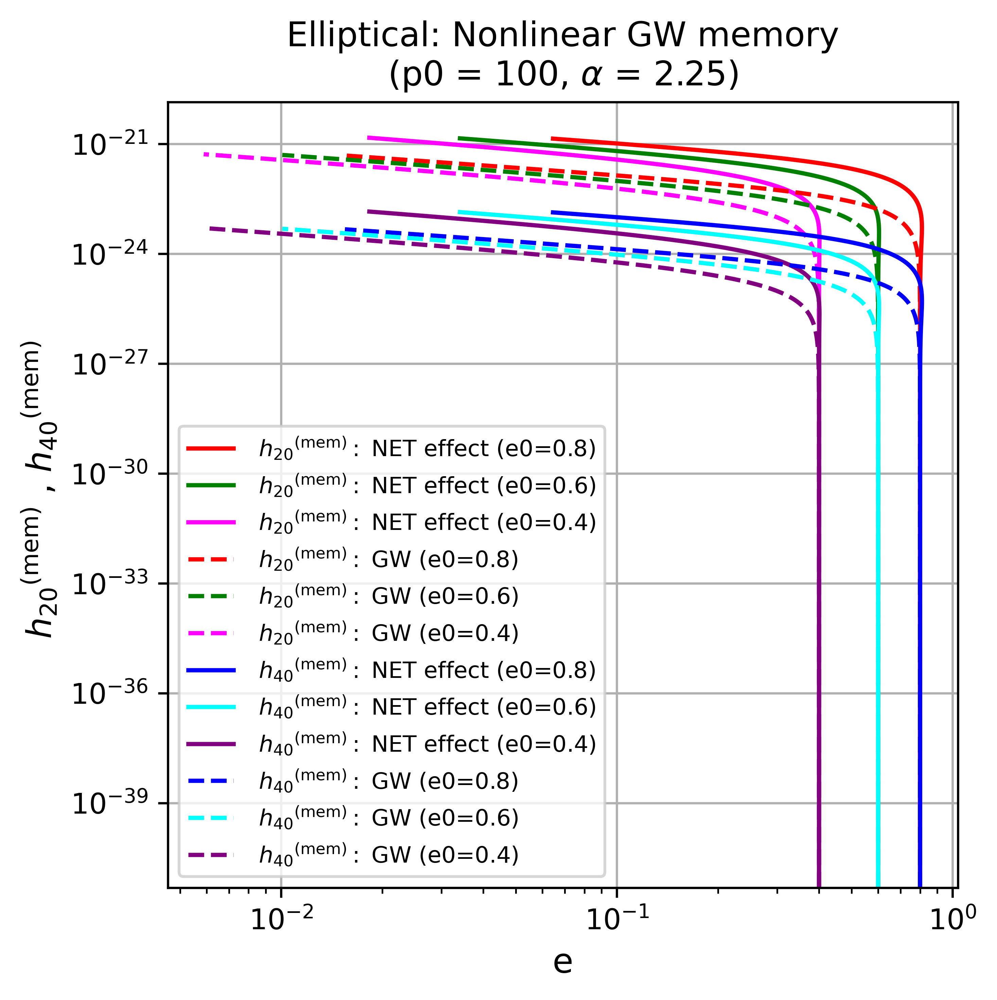

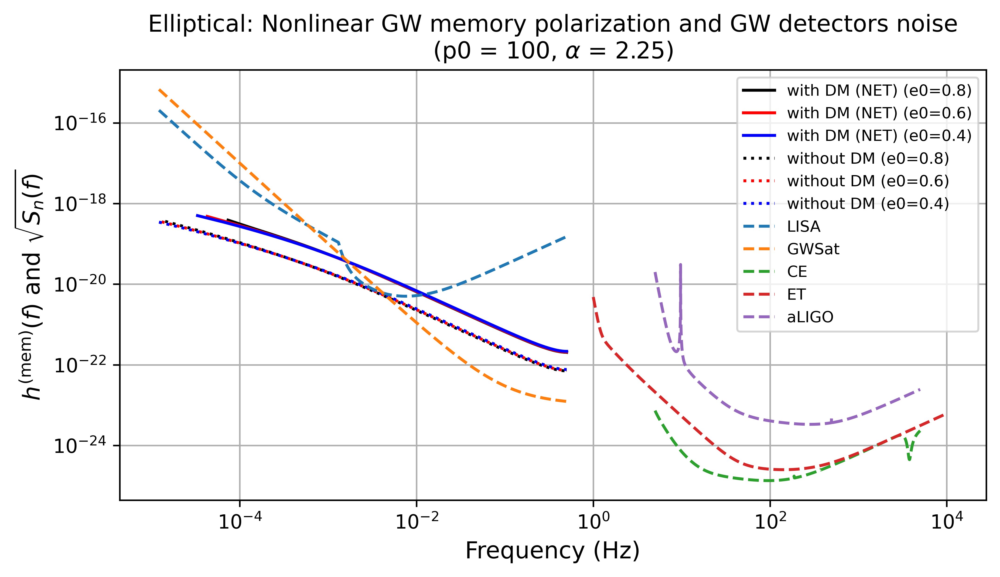

In [21]:
def elliptical_nonlinear_memo_diff_init_eccentricities(e_initials, p_0, omega_0, t_0, f_final, alpha, R):
    # initial eccentricities
    e0_1 = e_initials[0] 
    e0_2 = e_initials[1] 
    e0_3 = e_initials[2] 
    
    # Calculating Nonlinear GW memory for given initial orbital parameters
    nonlinear_memory1 = calculate_nonlinear_memory(e0_1, p_0, omega_0, t_0, f_final, alpha, R)
    nonlinear_memory2 = calculate_nonlinear_memory(e0_2, p_0, omega_0, t_0, f_final, alpha, R)
    nonlinear_memory3 = calculate_nonlinear_memory(e0_3, p_0, omega_0, t_0, f_final, alpha, R)
    
    # Only GW backreaction ( FAVATA result )
    fgw1, ygw1, h20_mem_gw1, h40_mem_gw1 = nonlinear_memory1.cal_hl0(F=0, combination=0)
    fgw2, ygw2, h20_mem_gw2, h40_mem_gw2 = nonlinear_memory2.cal_hl0(F=0, combination=0)
    fgw3, ygw3, h20_mem_gw3, h40_mem_gw3 = nonlinear_memory3.cal_hl0(F=0, combination=0)
    
    # NET : DM gravity + DF + Accretion + GW brxn
    f_net1, y_net1, h20_mem_NET1, h40_mem_NET1 = nonlinear_memory1.cal_hl0(F=FF(alpha), combination=3)
    f_net2, y_net2, h20_mem_NET2, h40_mem_NET2 = nonlinear_memory2.cal_hl0(F=FF(alpha), combination=3)
    f_net3, y_net3, h20_mem_NET3, h40_mem_NET3 = nonlinear_memory3.cal_hl0(F=FF(alpha), combination=3)

    # Nonlinear memory GW polarization frequency signal without DM (Only GW backrxn)
    hp_f_mem_without_DM1, pos_freq_without_DM1 = nonlinear_memory_gw_pol_fft(h20_mem_gw1, h40_mem_gw1)
    hp_f_mem_without_DM2, pos_freq_without_DM2 = nonlinear_memory_gw_pol_fft(h20_mem_gw2, h40_mem_gw2)
    hp_f_mem_without_DM3, pos_freq_without_DM3 = nonlinear_memory_gw_pol_fft(h20_mem_gw3, h40_mem_gw3)
    
    # Nonlinear memory GW polarization frequency signal with DM (NET Effect)
    hp_f_mem_with_DM_NET1, pos_freq_with_DM_NET1 = nonlinear_memory_gw_pol_fft(h20_mem_NET1, h40_mem_NET1)
    hp_f_mem_with_DM_NET2, pos_freq_with_DM_NET2 = nonlinear_memory_gw_pol_fft(h20_mem_NET2, h40_mem_NET2)
    hp_f_mem_with_DM_NET3, pos_freq_with_DM_NET3 = nonlinear_memory_gw_pol_fft(h20_mem_NET3, h40_mem_NET3)
    
    # GW detectors noise spectrum 
    pos_freq_without_DM = max([pos_freq_without_DM1, pos_freq_without_DM2, pos_freq_without_DM3], key=len) # select array of larger length      
    pos_freq_with_DM = max([pos_freq_with_DM_NET1, pos_freq_with_DM_NET2, pos_freq_with_DM_NET3], key=len) # select array of larger length
    LISA_frequency, LISA_strain = LISA_noise_psd(pos_freq_without_DM, pos_freq_with_DM)  # LISA
    GWSat_frequency, GWSat_strain = GWSat_noise_psd(pos_freq_without_DM, pos_freq_with_DM)  # GWsat
        
    # Plotting Nonlinear memory VS eccentrcity
    plt.figure(figsize=(5,5))
    plt.title('Elliptical: Nonlinear GW memory' + "\n" + f'(p0 = {p_0}, '+r'${{\alpha}}$' +f' = {alpha})')
    
    plt.plot( y_net1[0,:], h20_mem_NET1, label = r' ${h_{20}}^{\text{(mem)}}:$' +f' NET effect (e0={e0_1})', linestyle='-', color='red' )
    plt.plot( y_net2[0,:], h20_mem_NET2, label = r' ${h_{20}}^{\text{(mem)}}:$' +f' NET effect (e0={e0_2})', linestyle='-', color='green' )
    plt.plot( y_net3[0,:], h20_mem_NET3, label = r' ${h_{20}}^{\text{(mem)}}:$' +f' NET effect (e0={e0_3})', linestyle='-', color='magenta' )
    
    plt.plot( ygw1[0,:], h20_mem_gw1, label= r' ${h_{20}}^{\text{(mem)}}: $' + f' GW (e0={e0_1})', linestyle='--', color='red')
    plt.plot( ygw2[0,:], h20_mem_gw2, label= r' ${h_{20}}^{\text{(mem)}}: $' + f' GW (e0={e0_2})', linestyle='--', color='green')
    plt.plot( ygw3[0,:], h20_mem_gw3, label= r' ${h_{20}}^{\text{(mem)}}: $' + f' GW (e0={e0_3})', linestyle='--', color='magenta')
    
    plt.plot( y_net1[0,:], h40_mem_NET1, label = r' ${h_{40}}^{\text{(mem)}}:$' +f' NET effect (e0={e0_1})', linestyle='-', color='blue' )
    plt.plot( y_net2[0,:], h40_mem_NET2, label = r' ${h_{40}}^{\text{(mem)}}:$' +f' NET effect (e0={e0_2})', linestyle='-', color='cyan' )
    plt.plot( y_net3[0,:], h40_mem_NET3, label = r' ${h_{40}}^{\text{(mem)}}:$' +f' NET effect (e0={e0_3})', linestyle='-', color='purple' )
    
    plt.plot( ygw1[0,:], h40_mem_gw1, label= r' ${h_{40}}^{\text{(mem)}}: $' + f' GW (e0={e0_1})', linestyle='--', color='blue')
    plt.plot( ygw2[0,:], h40_mem_gw2, label= r' ${h_{40}}^{\text{(mem)}}: $' + f' GW (e0={e0_2})', linestyle='--', color='cyan')
    plt.plot( ygw3[0,:], h40_mem_gw3, label= r' ${h_{40}}^{\text{(mem)}}: $' + f' GW (e0={e0_3})', linestyle='--', color='purple')
    
    plt.xlabel('e')
    plt.ylabel(r' ${h_{20}}^{\text{(mem)}}$ , ${h_{40}}^{\text{(mem)}}$')
    plt.xscale('log')
    plt.yscale('log')
    plt.legend(loc='lower left')
    plt.grid(True)
    
    # Save as PDF
    plt.savefig("elliptical_spike_plot_3.pdf", format="pdf", bbox_inches="tight")
    
    plt.show()
    
    # Plotting : Nonlinear memory GW polarization frequency spectrum VS noise PSD of various GW detectors
    plt.figure(figsize=(8,4))
    plt.title('Elliptical: Nonlinear GW memory polarization and GW detectors noise'+"\n"+f'(p0 = {p_0}, '+r'${{\alpha}}$' +f' = {alpha})')
    
    plt.plot(pos_freq_with_DM_NET1, hp_f_mem_with_DM_NET1, color='black', linestyle='-', label=f'with DM (NET) (e0={e0_1})')
    plt.plot(pos_freq_with_DM_NET2, hp_f_mem_with_DM_NET2, color='red', linestyle='-', label=f'with DM (NET) (e0={e0_2})')
    plt.plot(pos_freq_with_DM_NET3, hp_f_mem_with_DM_NET3, color='blue', linestyle='-', label=f'with DM (NET) (e0={e0_3})')
    
    plt.plot(pos_freq_without_DM1, hp_f_mem_without_DM1, color='black', linestyle=':', label=f'without DM (e0={e0_1})')
    plt.plot(pos_freq_without_DM2, hp_f_mem_without_DM2, color='red', linestyle=':', label=f'without DM (e0={e0_2})')
    plt.plot(pos_freq_without_DM3, hp_f_mem_without_DM3, color='blue', linestyle=':', label=f'without DM (e0={e0_3})')
    
    plt.plot(LISA_frequency, LISA_strain, linestyle='--', label='LISA')
    plt.plot(GWSat_frequency, GWSat_strain, linestyle='--', label='GWSat')
    plt.plot(CE_frequency, CE_strain, linestyle='--', label='CE')
    plt.plot(ET_frequency, ET_strain, linestyle='--', label='ET')
    plt.plot(aLIGO_frequency, aLIGO_strain, linestyle='--', label='aLIGO')
    
    plt.xlabel('Frequency (Hz)')
    plt.ylabel(r'$h^{\text{(mem)}}(f)$ and $\sqrt{S_n (f)}$')
    plt.xscale('log')
    plt.yscale('log')
    plt.legend(loc='upper right')
    plt.grid(True)

    # Save as PDF
    plt.savefig("elliptical_spike_plot_4.pdf", format="pdf", bbox_inches="tight")

    plt.show()

# Initial orbital parameters
e_initials = [0.8, 0.6, 0.4] # initial eccentrcities
p0, omega0, t0 = 100, 0.0, 0.0

# Plotting Nonlinear memory for three-different initial eccentricities
elliptical_nonlinear_memo_diff_init_eccentricities(e_initials, p0, omega0, t0, f_final, alpha, R)

#### Elliptical: Nonlinear memory for three-different initial semi-latus rectum ( p )

A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.


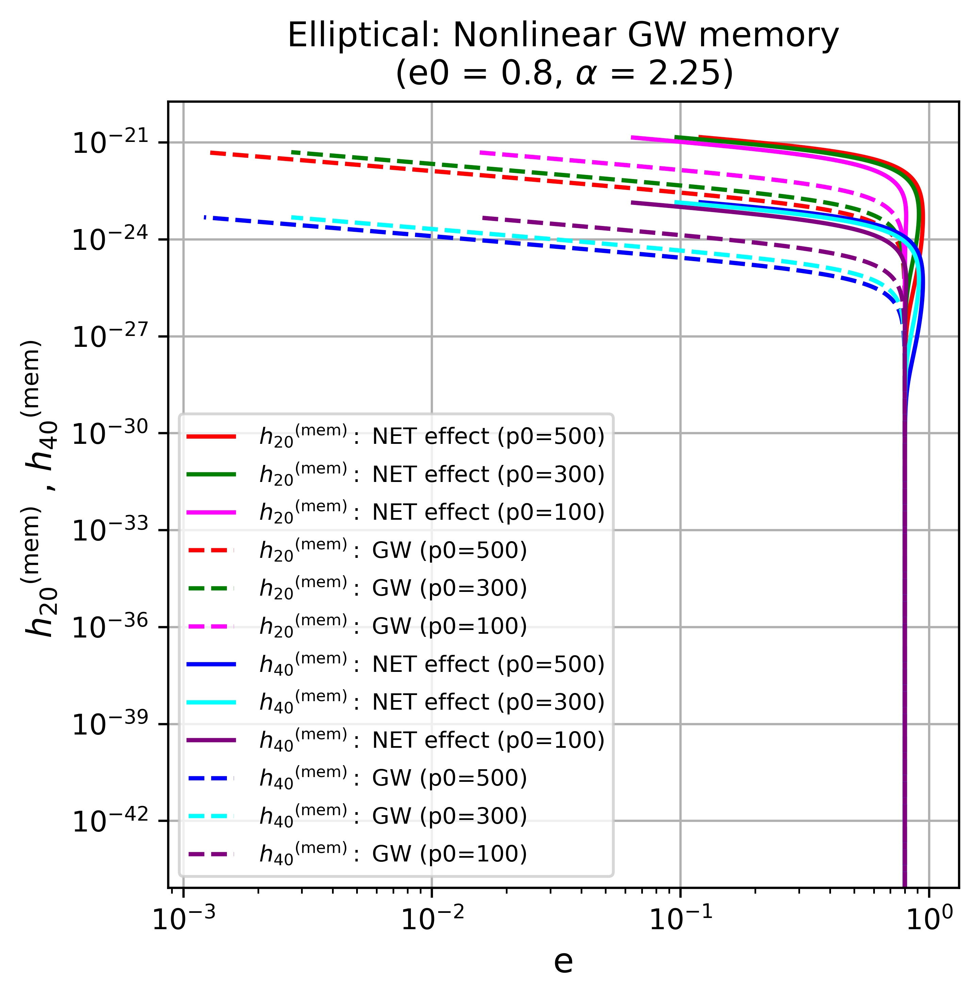

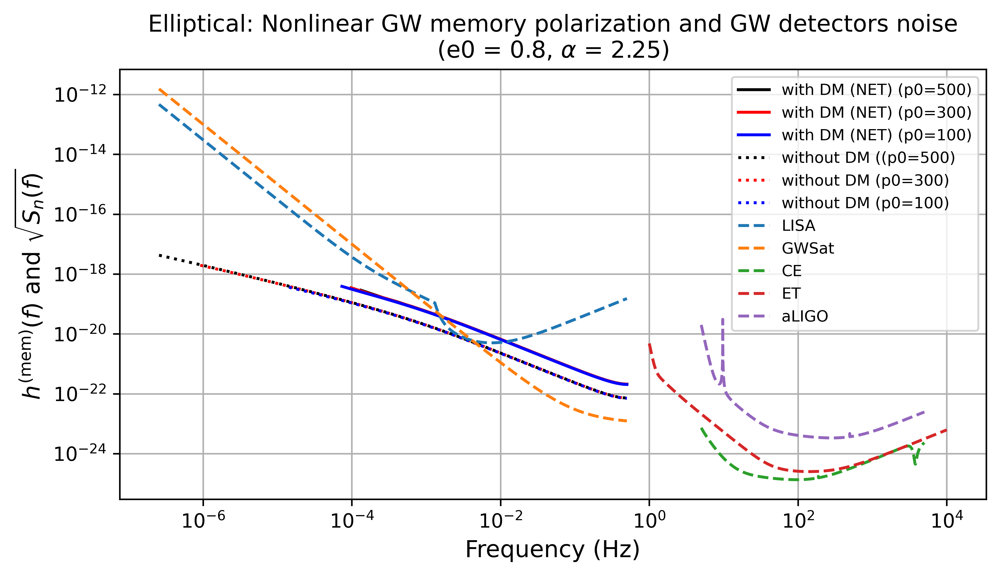

In [22]:
def elliptical_nonlinear_memo_diff_init_p(e_0, p_initials, omega_0, t_0, f_final, alpha, R):
    # initial semi-latus rectum values
    p0_1 = p_initials[0] 
    p0_2 = p_initials[1] 
    p0_3 = p_initials[2] 
    
    # Calculating Nonlinear GW memory for given initial orbital parameters
    nonlinear_memory1 = calculate_nonlinear_memory(e_0, p0_1, omega_0, t_0, f_final, alpha, R)
    nonlinear_memory2 = calculate_nonlinear_memory(e_0, p0_2, omega_0, t_0, f_final, alpha, R)
    nonlinear_memory3 = calculate_nonlinear_memory(e_0, p0_3, omega_0, t_0, f_final, alpha, R)
    
    # Only GW backreaction ( FAVATA result )
    fgw1, ygw1, h20_mem_gw1, h40_mem_gw1 = nonlinear_memory1.cal_hl0(F=0, combination=0)
    fgw2, ygw2, h20_mem_gw2, h40_mem_gw2 = nonlinear_memory2.cal_hl0(F=0, combination=0)
    fgw3, ygw3, h20_mem_gw3, h40_mem_gw3 = nonlinear_memory3.cal_hl0(F=0, combination=0)
    
    # NET : DM gravity + DF + Accretion + GW brxn
    f_net1, y_net1, h20_mem_NET1, h40_mem_NET1 = nonlinear_memory1.cal_hl0(F=FF(alpha), combination=3)
    f_net2, y_net2, h20_mem_NET2, h40_mem_NET2 = nonlinear_memory2.cal_hl0(F=FF(alpha), combination=3)
    f_net3, y_net3, h20_mem_NET3, h40_mem_NET3 = nonlinear_memory3.cal_hl0(F=FF(alpha), combination=3)

    # Nonlinear memory GW polarization frequency signal without DM (Only GW backrxn)
    hp_f_mem_without_DM1, pos_freq_without_DM1 = nonlinear_memory_gw_pol_fft(h20_mem_gw1, h40_mem_gw1)
    hp_f_mem_without_DM2, pos_freq_without_DM2 = nonlinear_memory_gw_pol_fft(h20_mem_gw2, h40_mem_gw2)
    hp_f_mem_without_DM3, pos_freq_without_DM3 = nonlinear_memory_gw_pol_fft(h20_mem_gw3, h40_mem_gw3)
    
    # Nonlinear memory GW polarization frequency signal with DM (NET Effect)
    hp_f_mem_with_DM_NET1, pos_freq_with_DM_NET1 = nonlinear_memory_gw_pol_fft(h20_mem_NET1, h40_mem_NET1)
    hp_f_mem_with_DM_NET2, pos_freq_with_DM_NET2 = nonlinear_memory_gw_pol_fft(h20_mem_NET2, h40_mem_NET2)
    hp_f_mem_with_DM_NET3, pos_freq_with_DM_NET3 = nonlinear_memory_gw_pol_fft(h20_mem_NET3, h40_mem_NET3)
    
    # GW detectors noise spectrum 
    pos_freq_without_DM = max([pos_freq_without_DM1, pos_freq_without_DM2, pos_freq_without_DM3], key=len) # select array of larger length      
    pos_freq_with_DM = max([pos_freq_with_DM_NET1, pos_freq_with_DM_NET2, pos_freq_with_DM_NET3], key=len) # select array of larger length
    LISA_frequency, LISA_strain = LISA_noise_psd(pos_freq_without_DM, pos_freq_with_DM)  # LISA
    GWSat_frequency, GWSat_strain = GWSat_noise_psd(pos_freq_without_DM, pos_freq_with_DM)  # GWsat
        
    # Plotting Nonlinear memory VS eccentrcity
    plt.figure(figsize=(5,5))
    plt.title('Elliptical: Nonlinear GW memory' + "\n" + f'(e0 = {e_0}, '+r'${{\alpha}}$' +f' = {alpha})')
    
    plt.plot( y_net1[0,:], h20_mem_NET1, label = r' ${h_{20}}^{\text{(mem)}}:$' +f' NET effect (p0={p0_1})', linestyle='-', color='red' )
    plt.plot( y_net2[0,:], h20_mem_NET2, label = r' ${h_{20}}^{\text{(mem)}}:$' +f' NET effect (p0={p0_2})', linestyle='-', color='green' )
    plt.plot( y_net3[0,:], h20_mem_NET3, label = r' ${h_{20}}^{\text{(mem)}}:$' +f' NET effect (p0={p0_3})', linestyle='-', color='magenta' )
    
    plt.plot( ygw1[0,:], h20_mem_gw1, label= r' ${h_{20}}^{\text{(mem)}}: $' + f' GW (p0={p0_1})', linestyle='--', color='red')
    plt.plot( ygw2[0,:], h20_mem_gw2, label= r' ${h_{20}}^{\text{(mem)}}: $' + f' GW (p0={p0_2})', linestyle='--', color='green')
    plt.plot( ygw3[0,:], h20_mem_gw3, label= r' ${h_{20}}^{\text{(mem)}}: $' + f' GW (p0={p0_3})', linestyle='--', color='magenta')
    
    plt.plot( y_net1[0,:], h40_mem_NET1, label = r' ${h_{40}}^{\text{(mem)}}:$' +f' NET effect (p0={p0_1})', linestyle='-', color='blue' )
    plt.plot( y_net2[0,:], h40_mem_NET2, label = r' ${h_{40}}^{\text{(mem)}}:$' +f' NET effect (p0={p0_2})', linestyle='-', color='cyan' )
    plt.plot( y_net3[0,:], h40_mem_NET3, label = r' ${h_{40}}^{\text{(mem)}}:$' +f' NET effect (p0={p0_3})', linestyle='-', color='purple' )
    
    plt.plot( ygw1[0,:], h40_mem_gw1, label= r' ${h_{40}}^{\text{(mem)}}: $' + f' GW (p0={p0_1})', linestyle='--', color='blue')
    plt.plot( ygw2[0,:], h40_mem_gw2, label= r' ${h_{40}}^{\text{(mem)}}: $' + f' GW (p0={p0_2})', linestyle='--', color='cyan')
    plt.plot( ygw3[0,:], h40_mem_gw3, label= r' ${h_{40}}^{\text{(mem)}}: $' + f' GW (p0={p0_3})', linestyle='--', color='purple')
    
    plt.xlabel('e')
    plt.ylabel(r' ${h_{20}}^{\text{(mem)}}$ , ${h_{40}}^{\text{(mem)}}$')
    plt.xscale('log')
    plt.yscale('log')
    plt.legend(loc='lower left')
    plt.grid(True)

    # Save as PDF
    plt.savefig("elliptical_spike_plot_5.pdf", format="pdf", bbox_inches="tight")

    plt.show()
    
    # Plotting : Nonlinear memory GW polarization frequency spectrum VS noise PSD of various GW detectors
    plt.figure(figsize=(8,4))
    plt.title('Elliptical: Nonlinear GW memory polarization and GW detectors noise'+"\n"+f'(e0 = {e_0}, '+r'${{\alpha}}$' +f' = {alpha})')
    
    plt.plot(pos_freq_with_DM_NET1, hp_f_mem_with_DM_NET1, color='black', linestyle='-', label=f'with DM (NET) (p0={p0_1})')
    plt.plot(pos_freq_with_DM_NET2, hp_f_mem_with_DM_NET2, color='red', linestyle='-', label=f'with DM (NET) (p0={p0_2})')
    plt.plot(pos_freq_with_DM_NET3, hp_f_mem_with_DM_NET3, color='blue', linestyle='-', label=f'with DM (NET) (p0={p0_3})')
    
    plt.plot(pos_freq_without_DM1, hp_f_mem_without_DM1, color='black', linestyle=':', label=f'without DM ((p0={p0_1})')
    plt.plot(pos_freq_without_DM2, hp_f_mem_without_DM2, color='red', linestyle=':', label=f'without DM (p0={p0_2})')
    plt.plot(pos_freq_without_DM3, hp_f_mem_without_DM3, color='blue', linestyle=':', label=f'without DM (p0={p0_3})')
    
    plt.plot(LISA_frequency, LISA_strain, linestyle='--', label='LISA')
    plt.plot(GWSat_frequency, GWSat_strain, linestyle='--', label='GWSat')
    plt.plot(CE_frequency, CE_strain, linestyle='--', label='CE')
    plt.plot(ET_frequency, ET_strain, linestyle='--', label='ET')
    plt.plot(aLIGO_frequency, aLIGO_strain, linestyle='--', label='aLIGO')
    
    plt.xlabel('Frequency (Hz)')
    plt.ylabel(r'$h^{\text{(mem)}}(f)$ and $\sqrt{S_n (f)}$')
    plt.xscale('log')
    plt.yscale('log')
    plt.legend(loc='upper right')
    plt.grid(True)

    # Save as PDF
    plt.savefig("elliptical_spike_plot_6.pdf", format="pdf", bbox_inches="tight")
    
    plt.show()

# Initial orbital parameters
p_initials = [500, 300, 100] # initial semi-latus rectum values in ISCO units
e0, omega0, t0 = 0.8, 0.0, 0.0

# Plotting Nonlinear memory for three-different initial semi-latus rectum values
elliptical_nonlinear_memo_diff_init_p(e0, p_initials, omega0, t0, f_final, alpha, R)

#### Elliptical : Nonlinear memory for three-different Static DM exponent ($\alpha$) values

A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.


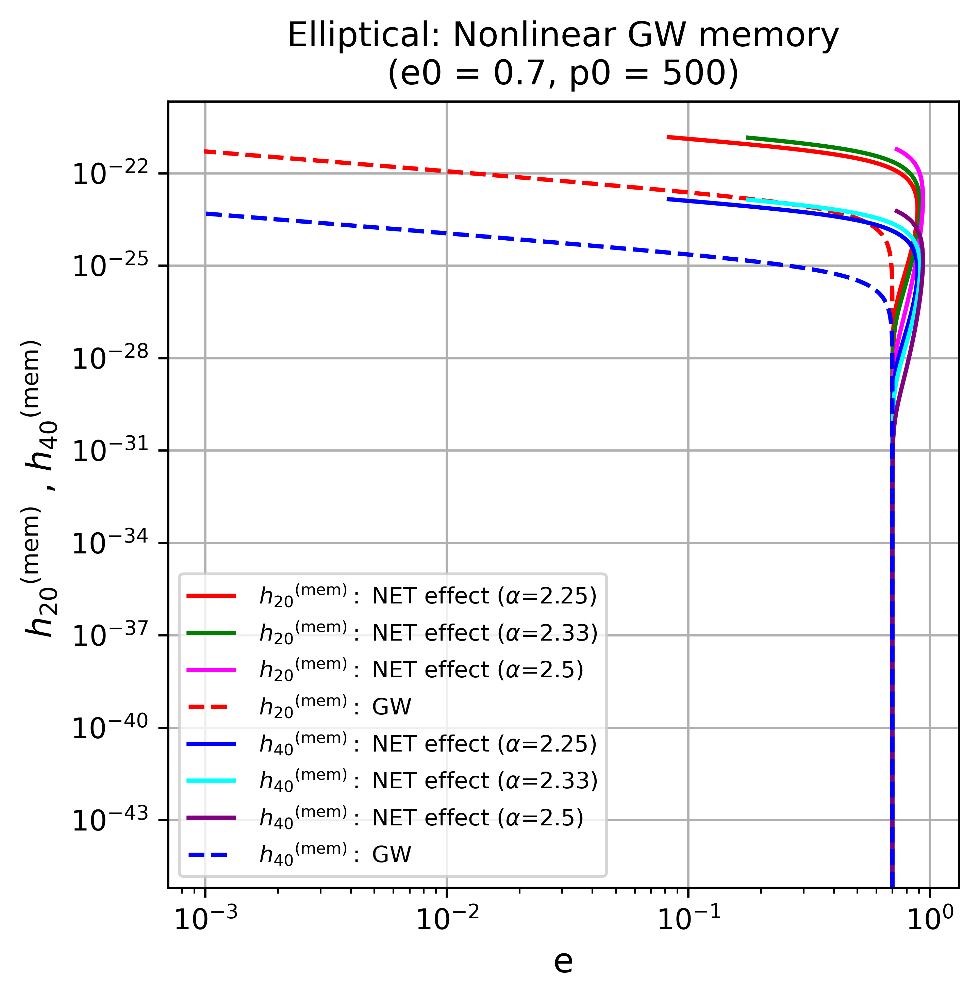

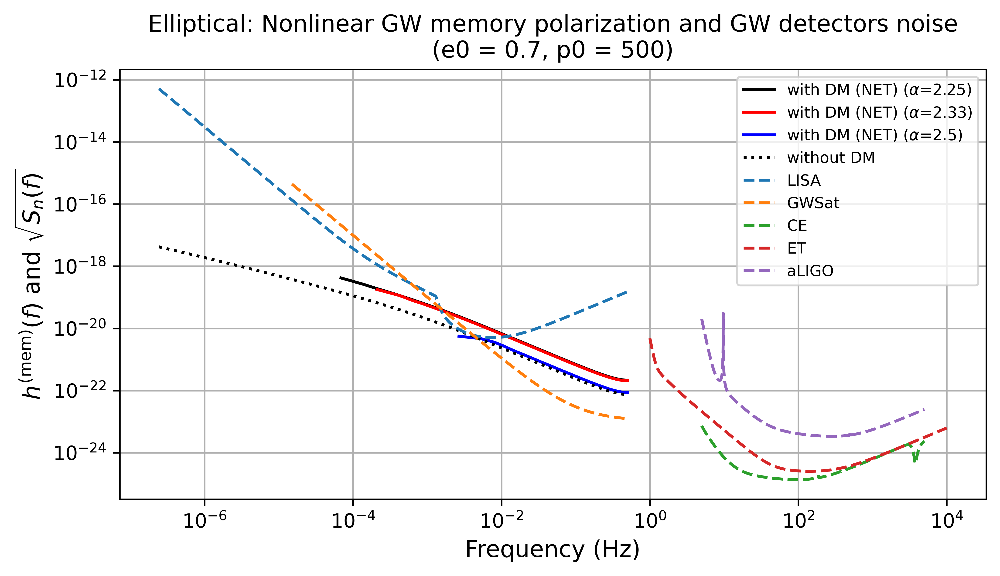

In [23]:
def elliptical_nonlinear_memo_diff_DM_exponent_vals(e_0, p_0, omega_0, t_0, f_final, alpha_vals, R):
    #  Static DM exponent values
    alpha_1 = alpha_vals[0] 
    alpha_2 = alpha_vals[1]
    alpha_3 = alpha_vals[2] 
    
    # Calculating Nonlinear GW memory for given initial orbital parameters
    nonlinear_memory1 = calculate_nonlinear_memory(e_0, p_0, omega_0, t_0, f_final, alpha_1, R)
    nonlinear_memory2 = calculate_nonlinear_memory(e_0, p_0, omega_0, t_0, f_final, alpha_2, R)
    nonlinear_memory3 = calculate_nonlinear_memory(e_0, p_0, omega_0, t_0, f_final, alpha_3, R)
    
    # Only GW backreaction ( FAVATA result )
    fgw1, ygw1, h20_mem_gw1, h40_mem_gw1 = nonlinear_memory1.cal_hl0(F=0, combination=0)
    
    # NET : DM gravity + DF + Accretion + GW brxn
    f_net1, y_net1, h20_mem_NET1, h40_mem_NET1 = nonlinear_memory1.cal_hl0(F=FF(alpha_1), combination=3)
    f_net2, y_net2, h20_mem_NET2, h40_mem_NET2 = nonlinear_memory2.cal_hl0(F=FF(alpha_2), combination=3)
    f_net3, y_net3, h20_mem_NET3, h40_mem_NET3 = nonlinear_memory3.cal_hl0(F=FF(alpha_3), combination=3)

    # Nonlinear memory GW polarization frequency signal without DM (Only GW backrxn)
    hp_f_mem_without_DM1, pos_freq_without_DM1 = nonlinear_memory_gw_pol_fft(h20_mem_gw1, h40_mem_gw1)
    
    # Nonlinear memory GW polarization frequency signal with DM (NET Effect)
    hp_f_mem_with_DM_NET1, pos_freq_with_DM_NET1 = nonlinear_memory_gw_pol_fft(h20_mem_NET1, h40_mem_NET1)
    hp_f_mem_with_DM_NET2, pos_freq_with_DM_NET2 = nonlinear_memory_gw_pol_fft(h20_mem_NET2, h40_mem_NET2)
    hp_f_mem_with_DM_NET3, pos_freq_with_DM_NET3 = nonlinear_memory_gw_pol_fft(h20_mem_NET3, h40_mem_NET3)
    
    # GW detectors noise spectrum 
    pos_freq_with_DM = max([pos_freq_with_DM_NET1, pos_freq_with_DM_NET2, pos_freq_with_DM_NET3], key=len) # select array of larger length
    LISA_frequency, LISA_strain = LISA_noise_psd(pos_freq_without_DM1, pos_freq_with_DM)  # LISA
    GWSat_frequency, GWSat_strain = GWSat_noise_psd(pos_freq_without_DM, pos_freq_with_DM)  # GWsat
        
    # Plotting Nonlinear memory VS eccentrcity
    plt.figure(figsize=(5,5))
    plt.title('Elliptical: Nonlinear GW memory' + "\n" + f'(e0 = {e_0}, p0 = {p_0})')
    
    plt.plot( y_net1[0,:], h20_mem_NET1, label = r' ${h_{20}}^{\text{(mem)}}:$' +rf' NET effect ($\alpha$={alpha_1})', linestyle='-', color='red' )
    plt.plot( y_net2[0,:], h20_mem_NET2, label = r' ${h_{20}}^{\text{(mem)}}:$' +rf' NET effect ($\alpha$={alpha_2})', linestyle='-', color='green' )
    plt.plot( y_net3[0,:], h20_mem_NET3, label = r' ${h_{20}}^{\text{(mem)}}:$' +rf' NET effect ($\alpha$={alpha_3})', linestyle='-', color='magenta' )
    
    plt.plot( ygw1[0,:], h20_mem_gw1, label= r' ${h_{20}}^{\text{(mem)}}: $' + rf' GW', linestyle='--', color='red')
    
    plt.plot( y_net1[0,:], h40_mem_NET1, label = r' ${h_{40}}^{\text{(mem)}}:$' +rf' NET effect ($\alpha$={alpha_1})', linestyle='-', color='blue' )
    plt.plot( y_net2[0,:], h40_mem_NET2, label = r' ${h_{40}}^{\text{(mem)}}:$' +rf' NET effect ($\alpha$={alpha_2})', linestyle='-', color='cyan' )
    plt.plot( y_net3[0,:], h40_mem_NET3, label = r' ${h_{40}}^{\text{(mem)}}:$' +rf' NET effect ($\alpha$={alpha_3})', linestyle='-', color='purple' )
    
    plt.plot( ygw1[0,:], h40_mem_gw1, label= r' ${h_{40}}^{\text{(mem)}}: $' + rf' GW', linestyle='--', color='blue')
    
    plt.xlabel('e')
    plt.ylabel(r' ${h_{20}}^{\text{(mem)}}$ , ${h_{40}}^{\text{(mem)}}$')
    plt.xscale('log')
    plt.yscale('log')
    plt.legend(loc='lower left')
    plt.grid(True)

    # Save as PDF
    plt.savefig("elliptical_spike_plot_7.pdf", format="pdf", bbox_inches="tight") 

    plt.show()
    
    # Plotting : Nonlinear memory GW polarization frequency spectrum VS noise PSD of various GW detectors
    plt.figure(figsize=(8,4))
    plt.title('Elliptical: Nonlinear GW memory polarization and GW detectors noise'+"\n"+f'(e0 = {e_0}, p0 = {p_0})')
    
    plt.plot(pos_freq_with_DM_NET1, hp_f_mem_with_DM_NET1, color='black', linestyle='-', label=rf'with DM (NET) ($\alpha$={alpha_1})')
    plt.plot(pos_freq_with_DM_NET2, hp_f_mem_with_DM_NET2, color='red', linestyle='-', label=rf'with DM (NET) ($\alpha$={alpha_2})')
    plt.plot(pos_freq_with_DM_NET3, hp_f_mem_with_DM_NET3, color='blue', linestyle='-', label=rf'with DM (NET) ($\alpha$={alpha_3})')
    
    plt.plot(pos_freq_without_DM1, hp_f_mem_without_DM1, color='black', linestyle=':', label=f'without DM')
    
    plt.plot(LISA_frequency, LISA_strain, linestyle='--', label='LISA')
    plt.plot(GWSat_frequency, GWSat_strain, linestyle='--', label='GWSat')
    plt.plot(CE_frequency, CE_strain, linestyle='--', label='CE')
    plt.plot(ET_frequency, ET_strain, linestyle='--', label='ET')
    plt.plot(aLIGO_frequency, aLIGO_strain, linestyle='--', label='aLIGO')
    
    plt.xlabel('Frequency (Hz)')
    plt.ylabel(r'$h^{\text{(mem)}}(f)$ and $\sqrt{S_n (f)}$')
    plt.xscale('log')
    plt.yscale('log')
    plt.legend(loc='upper right')
    plt.grid(True)

    # Save as PDF
    plt.savefig("elliptical_spike_plot_8.pdf", format="pdf", bbox_inches="tight")

    plt.show()

# Initial orbital parameters
e0, p0, omega0, t0 = 0.7, 500, 0.0, 0.0

alpha_vals = [2.25, 2.33, 2.5] # Static DM exponent values

# Plotting Nonlinear memory for three-different Static DM exponent values
elliptical_nonlinear_memo_diff_DM_exponent_vals(e0, p0, omega0, t0, f_final, alpha_vals, R)

## Quasicircular binaries in Static DM environment 

In [76]:
# Averaged osculating equations considering only ( GW brxn ) for Quasi-circular orbit
def osculating_eqn_quasi_circ_gw_brxn(y):
    e, p, omega, t = y
    dedf = -(8/5)*eta*(((M)**(5/2))/((p**(5/2))))*( (304/24)*e + (121/24)*(e**3) )
    dpdf = -(8/5)*eta*(((M)**(5/2))/((p**(3/2))))*( 8 + 7*(e**2) ) 
    domegadf = 0.0
    dtdf = (1/np.sqrt(8*M))*(p**(3/2))*( 8 + 12 * e**2 + 15 * e**4 )
    return [dedf, dpdf, domegadf, dtdf]
        
# Averaged osculating equations considering only ( DF ) for Quasi-circular orbit
def osculating_eqn_quasi_circ_DF(y, alpha, I_v):
    e, p, omega, t = y
    dedf = (1/(2* M**2))*m2*np.pi*(r_sp**alpha)*I_v*rho_sp*e*(p**(3-alpha))*(3-alpha)*( 8 + (e**2)*(27-11*alpha+ alpha**2) )
    dpdf = -(1/(8* M**2))*m2*np.pi*(r_sp**alpha)*I_v*rho_sp*(p**(4-alpha))*(64+ 16*(e**2)*(27-11*alpha + alpha**2) +
                                                                            (e**4)*(1389+alpha*(-976+alpha*(245-26*alpha + alpha**2))))
    domegadf = 0.0
    dtdf = (1/np.sqrt(8*M))*(p**(3/2))*( 8 + 12 * e**2 + 15 * e**4 )
    return [dedf, dpdf, domegadf, dtdf]

class quasi_circ_orbit_evolution_static_DM():
    # Initial parameters
    def __init__(self, e_i, p_i, omega_i, t_i, f_final, alpha, I_v):
        self.e_i = e_i
        self.p_i = p_i
        self.omega_i = omega_i
        self.t_i = t_i
        self.f_final = f_final
        self.alpha = alpha
        self.I_v = I_v
        
    # Quasicircular orbit evolution
    def quasi_circ_orbit_evolution_DF_gw_brxn(self, combination):
        # Define the event function
        def stopping_condition(f, y):
            e, p, omega, t = y
            # Final value (Last Stable Orbit) of semi-latus rectum in ISCO units
            p_end = ( 6 + 2*self.e_i )*r_min/l0
            return p - p_end  # Integration stops when 'p' reaches ISCO distance

        # Make the event terminal and specify the direction
        stopping_condition.terminal = True    # ensures that the solver stops integration when the event is detected.
        stopping_condition.direction = 0      # allows the detection of zero crossings in any direction (i.e., both increasing and decreasing)
        
        # Initial conditions
        initial_conditions = [self.e_i, self.p_i, self.omega_i, self.t_i]

        f_span = (0,self.f_final)   # True anomaly 'f'
        
        if combination == 0:
            # Coupled osculating equations for ( GW brxn )
            def coupled_osculating_eqns(f, y):
                return osculating_eqn_quasi_circ_gw_brxn(y)

        if combination == 1:
            # STATIC DM minispike profile : Coupled osculating equations for ( DF + GW brxn )
            def coupled_osculating_eqns(f, y):
                return np.add(osculating_eqn_quasi_circ_gw_brxn(y), osculating_eqn_quasi_circ_DF(y, self.alpha, self.I_v))

        # Solve the system using solve_ivp
        solution = solve_ivp(coupled_osculating_eqns, f_span, initial_conditions, events=stopping_condition, method='RK45', 
                             atol=1e-16, rtol=1e-10, max_step=100*np.pi)

        # print(solution.success)
        # print(solution.status)
        print(solution.message)
        
        return solution.t, solution.y

In [77]:
# Initial eccentricity for Quasi-circular case
quasi_e_i = 0.01
# Initial value of semi-latus rectum in ISCO units
quasi_p_i = 500 
# Initial value of omega in radians
quasi_omega_i = 0.0  
# Staring time
quasi_t_i = 0.0

# Final value of 'f' 
quasi_f_final = 1e15*(np.pi)

In [78]:
# For STATIC DM profile
sol_quasi_circ_static = quasi_circ_orbit_evolution_static_DM(quasi_e_i, quasi_p_i, quasi_omega_i, quasi_t_i, quasi_f_final, alpha, I_v)

# For GW brxn only
f_quasi_circ_gw, y_quasi_circ_gw = sol_quasi_circ_static.quasi_circ_orbit_evolution_DF_gw_brxn(combination=0)

# For DF + GW brxn 
f_quasi_circ_df_gw_static, y_quasi_circ_df_gw_static = sol_quasi_circ_static.quasi_circ_orbit_evolution_DF_gw_brxn(combination=1)

A termination event occurred.
A termination event occurred.


In [79]:
#----For GW BACKREACTION ( Quasicircular orbit )
plt.figure(figsize=(28,7))

plt.subplot(141)
plt.plot( f_quasi_circ_gw, y_quasi_circ_gw[0])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel('e', fontsize =14)
plt.yscale('log')
plt.title('GW brxn ( Quasicircular ):'+'\n'+ rf'$e_i$ = {quasi_e_i}, $p_i$ = {quasi_p_i}(ISCO units), $\omega_i$ = {quasi_omega_i}')

plt.subplot(142)
plt.plot( f_quasi_circ_gw, y_quasi_circ_gw[1])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel('p ( ISCO units )', fontsize =14)
plt.yscale('log')
plt.title('GW brxn ( Quasicircular ):'+'\n'+ rf'$e_i$ = {quasi_e_i}, $p_i$ = {quasi_p_i}(ISCO units), $\omega_i$ = {quasi_omega_i}')

plt.subplot(143)
plt.plot( f_quasi_circ_gw, y_quasi_circ_gw[2])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel(r'$\omega$ ( radians )', fontsize =14)
plt.title('GW brxn ( Quasicircular ):'+'\n'+ rf'$e_i$ = {quasi_e_i}, $p_i$ = {quasi_p_i}(ISCO units), $\omega_i$ = {quasi_omega_i}')

#----'e' Vs 'p'
plt.subplot(144)
plt.plot( y_quasi_circ_gw[1], y_quasi_circ_gw[0])
plt.xscale('log')
plt.yscale('log')
plt.xlabel('p ( ISCO units )', fontsize =14)
plt.ylabel('e', fontsize =14)
plt.title('GW brxn ( Quasicircular ):'+'\n'+ rf'$e_i$ = {quasi_e_i}, $p_i$ = {quasi_p_i}(ISCO units), $\omega_i$ = {quasi_omega_i}')

plt.show()

In [80]:
#----STATIC DM minispike profile : For ( DF + GW BACKREACTION ) ( Quasicircular orbit )
plt.figure(figsize=(28,7))

plt.subplot(141)
plt.plot( f_quasi_circ_df_gw_static, y_quasi_circ_df_gw_static[0])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel('e', fontsize =14)
plt.yscale('log')
plt.title('Static DM profile : DF + GW brxn ( Quasicircular )'+'\n'+ rf'$e_i$ = {quasi_e_i}, $p_i$ = {quasi_p_i}(ISCO units), $\omega_i$ = {quasi_omega_i}')

plt.subplot(142)
plt.plot( f_quasi_circ_df_gw_static, y_quasi_circ_df_gw_static[1])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel('p ( ISCO units )', fontsize =14)
plt.yscale('log')
plt.title('Static DM profile : DF + GW brxn ( Quasicircular )'+'\n'+ rf'$e_i$ = {quasi_e_i}, $p_i$ = {quasi_p_i}(ISCO units), $\omega_i$ = {quasi_omega_i}')

plt.subplot(143)
plt.plot( f_quasi_circ_df_gw_static, y_quasi_circ_df_gw_static[2])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel(r'$\omega$ ( radians )', fontsize =14)
plt.title('Static DM profile : DF + GW brxn ( Quasicircular )'+'\n'+ rf'$e_i$ = {quasi_e_i}, $p_i$ = {quasi_p_i}(ISCO units), $\omega_i$ = {quasi_omega_i}')

#----'e' Vs 'p'
plt.subplot(144)
plt.plot( y_quasi_circ_df_gw_static[1], y_quasi_circ_df_gw_static[0])
plt.xscale('log')
plt.yscale('log')
plt.xlabel('p ( ISCO units )', fontsize =14)
plt.ylabel('e', fontsize =14)
plt.title('Static DM profile : DF + GW brxn ( Quasicircular )'+'\n'+ rf'$e_i$ = {quasi_e_i}, $p_i$ = {quasi_p_i}(ISCO units), $\omega_i$ = {quasi_omega_i}')

plt.show()

## Quasicircular binaries in Dynamic DM environment ( Empirically )

<center>    
$ \rho_{DM} (r) = 
\begin{cases} 
\rho_{sp} \big( \frac{r_{sp}}{r} \big)^{\alpha} &  r = r_{init} \\
\rho_{sp} \big( \frac{r_{sp}}{r} \big)^{\alpha + \gamma (\kappa)} &  r >> r_b \\
\rho_{sp} \big( \frac{r_{sp}}{r} \big)^{\alpha} & r << r_b \\
\end{cases} $
</center>    

where $\alpha = 2.25 $ (taken)

<center>
$\gamma ( \kappa ) = (2.5-\alpha) \times e^{-( \kappa (r) - \kappa_{max} )^2}$
</center>


$(2.5-\alpha)$ factor is there to restrict DM minispike exponent in between $[2.25, 2.5]$. 

And

<center>
$\kappa ( r ) = \frac{ \kappa_f }{(r_{ISCO} - r_{init})} ( r - r_{init} )$
</center>

$$ $$

$\kappa_{max}$ correspond to $ r = r_b $ ( we approximate break distance as distance where $\big( \frac{de}{df} \big)_{GW} = \big( \frac{de}{df} \big)_{DF}$ )

Set $\boxed{\kappa_f = 10} $ such that $\gamma (\kappa_f)$ becomes very small (nearly zero) when binaries at small separations (ISCO distance) thus $\rho_{DM} \propto r^{-\alpha}$ for $ r << r_b$.

#### NOTE : This analysis is only possible when there is competition of eccentricity growth by dynamical friction and eccentricity decay by GW backreaction, that will occur when binaries start from sufficiently large separations such that initially dynamical friction is dominant and later GW backreaction effect is dominant. Therefore, the initial semi-latus rectum for a quasi-circular orbit should be chosen large (greater than about $300 \times r_{\text{ISCO}}$).

In [83]:
def imp_distance_pts(y, f):
    r = rel_distance(y, f)
    r_init = r[0]                             # Initial distance between binaries
    break_index = np.where(y[0,:]==np.max(y[0,:]))[0]  
    rb = r[break_index]                       # break distance where DF loss = GW loss, input from orbital evolution in static DM 
    return r_init, rb
    
def kappa(r, r_init, kf):
    r_isco = r_min/l0 # distances are in ISCO units
    return kf*(r-r_init)/(r_isco-r_init)

def gamma_kappa(y, f, r_init, rb, kf, alpha):
    r = rel_distance(y, f)             
    k = kappa(r, r_init, kf)
    k_max = kappa(rb, r_init, kf)
    return (2.5 - alpha)*np.exp(-(k-k_max)**2), k, k_max

def static_rho_dm_minispike(y, f, alpha): 
    r = rel_distance(y, f)
    return rho_sp*(r_sp/r)**alpha

def dynamic_rho_dm_minispike(y, f, alpha, r_init, rb, kf): 
    r = rel_distance(y, f)
    g_e, k, k_max = gamma_kappa(y, f, r_init, rb, kf, alpha)
    return rho_sp*(r_sp/r)**(alpha+g_e)

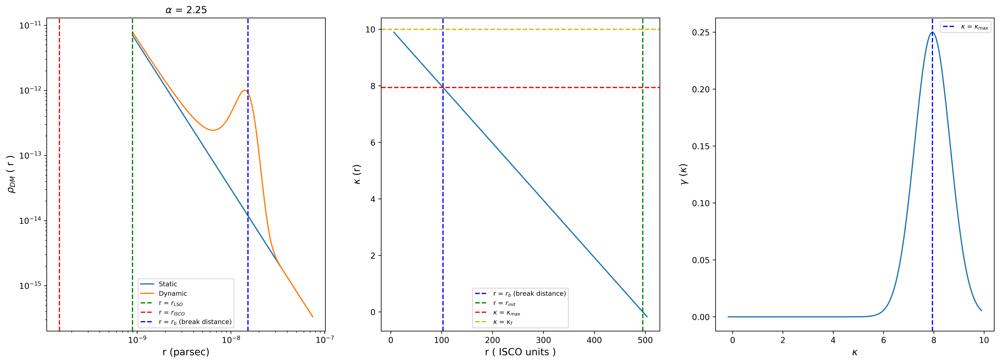

In [84]:
r = rel_distance(y_quasi_circ_df_gw_static, f_quasi_circ_df_gw_static)
r_init, rb = imp_distance_pts(y_quasi_circ_df_gw_static, f_quasi_circ_df_gw_static)
kf = 10.0              # some large value s.t gamma_e is approximately almost zero
gamma_k, k, k_max = gamma_kappa(y_quasi_circ_df_gw_static, f_quasi_circ_df_gw_static, r_init, rb, kf, alpha)

# Plotting Static VS Dynamic DM density profile
plt.figure(figsize=(21,7))

plt.subplot(131)
plt.title(rf'$\alpha$ = {alpha}')
plt.plot(r*l0/pc, static_rho_dm_minispike(y_quasi_circ_df_gw_static, f_quasi_circ_df_gw_static, alpha), label='Static')
plt.plot(r*l0/pc, dynamic_rho_dm_minispike(y_quasi_circ_df_gw_static, f_quasi_circ_df_gw_static, alpha, r_init, rb, kf), label='Dynamic')
plt.axvline(x=(6+2*quasi_e_i)*r_min/pc, color='g', linestyle='--', label=r'r = $r_{LSO}$')
plt.axvline(x=r_min/pc, color='r', linestyle='--', label=r'r = $r_{ISCO}$')
plt.axvline(x=rb*l0/pc, color='b', linestyle='--', label=r'r = $r_{b}$ (break distance)')
plt.xlabel('r (parsec)')
plt.ylabel(r'$\rho_{DM} $ ( r )')
plt.xscale('log')
plt.yscale('log')
plt.legend()

plt.subplot(132)
plt.plot(r,k)
plt.xlabel('r ( ISCO units )')
plt.ylabel(r'$\kappa$ (r)')
plt.axvline(x=rb, color='b', linestyle='--', label=r'r = $r_{b}$ (break distance)')
plt.axvline(x=r_init, color='g', linestyle='--', label=r'r = $r_{init}$')
plt.axhline(y=k_max, color='r', linestyle='--', label=r'$\kappa$ = $\kappa_{max}$')
plt.axhline(y=kf, color='y', linestyle='--', label=r'$\kappa$ = $\kappa_{f}$')
plt.legend()

plt.subplot(133)
plt.plot(k, gamma_k)
plt.ylabel(r'$\gamma$ ($\kappa$)')
plt.xlabel(r'$\kappa$')
plt.axvline(x=k_max, color='b', linestyle='--', label=r'$\kappa$ = $\kappa_{max}$')
plt.legend()

plt.show()

In [85]:
class quasi_circ_orbit_evolution_dynamic_DM(quasi_circ_orbit_evolution_static_DM):
    # Initial parameters
    def __init__(self, e_i, p_i, omega_i, t_i, f_final, alpha, I_v, r_init, rb, kf):
        super().__init__(e_i, p_i, omega_i, t_i, f_final, alpha, I_v)
        self.r_init = r_init
        self.rb = rb
        self.kf = kf
        
    # Quasicircular orbit evolution
    def quasi_circ_orbit_evolution_DF_gw_brxn_dynamic_DM(self):
        # Define the event function
        def stopping_condition(f, y):
            e, p, omega, t = y
            # Final value of semi-latus rectum in meters ( at ISCO )
            p_end = ( 6 + 2*self.e_i )*r_min/l0
            return p - p_end  # Integration stops when 'p' reaches ISCO distance

        # Make the event terminal and specify the direction
        stopping_condition.terminal = True    # ensures that the solver stops integration when the event is detected.
        stopping_condition.direction = 0      # allows the detection of zero crossings in any direction (i.e., both increasing and decreasing)
        
        # Initial conditions
        initial_conditions = [self.e_i, self.p_i, self.omega_i, self.t_i]

        f_span = (0,self.f_final)   # True anomaly 'f'

        # DYNAMIC DM minispike profile : Coupled osculating equations for ( DF + GW brxn )
        def coupled_osculating_eqns(f, y):
            gamma_k, k, k_max = gamma_kappa(y, f, self.r_init, self.rb, self.kf, self.alpha)
            return np.add(osculating_eqn_quasi_circ_gw_brxn(y), osculating_eqn_quasi_circ_DF(y, (self.alpha + gamma_k).item(), self.I_v))

        # Solve the system using solve_ivp
        solution = solve_ivp(coupled_osculating_eqns, f_span, initial_conditions, events=stopping_condition, method='RK45', 
                             atol=1e-16, rtol=1e-10, max_step=100*np.pi)

        # print(solution.success)
        # print(solution.status)
        print(solution.message)
        
        return solution.t, solution.y

In [86]:
# For DYNAMIC DM profile ( Empirical )
sol_quasi_circ_dynamic = quasi_circ_orbit_evolution_dynamic_DM(quasi_e_i, quasi_p_i, quasi_omega_i, quasi_t_i, quasi_f_final, alpha, I_v,
                                                               r_init, rb, kf)
# For DF + GW brxn 
f_quasi_circ_df_gw_dynamic, y_quasi_circ_df_gw_dynamic = sol_quasi_circ_dynamic.quasi_circ_orbit_evolution_DF_gw_brxn_dynamic_DM()

A termination event occurred.


In [87]:
#----DYNAMIC DM minispike profile : For ( DF + GW BACKREACTION ) ( Quasicircular orbit )
plt.figure(figsize=(28,7))

plt.subplot(141)
plt.plot( f_quasi_circ_df_gw_dynamic, y_quasi_circ_df_gw_dynamic[0])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel('e', fontsize =14)
plt.yscale('log')
plt.title('Dynamic DM profile : DF + GW brxn ( Quasicircular )'+'\n'+ rf'$e_i$ = {quasi_e_i}, $p_i$ = {quasi_p_i}(ISCO units), $\omega_i$ = {quasi_omega_i}')

plt.subplot(142)
plt.plot( f_quasi_circ_df_gw_dynamic, y_quasi_circ_df_gw_dynamic[1])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel('p ( ISCO units )', fontsize =14)
plt.yscale('log')
plt.title('Dynamic DM profile : DF + GW brxn ( Quasicircular )'+'\n'+ rf'$e_i$ = {quasi_e_i}, $p_i$ = {quasi_p_i}(ISCO units), $\omega_i$ = {quasi_omega_i}')

plt.subplot(143)
plt.plot( f_quasi_circ_df_gw_dynamic, y_quasi_circ_df_gw_dynamic[2])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel(r'$\omega$ ( radians )', fontsize =14)
plt.title('Dynamic DM profile : DF + GW brxn ( Quasicircular )'+'\n'+ rf'$e_i$ = {quasi_e_i}, $p_i$ = {quasi_p_i}(ISCO units), $\omega_i$ = {quasi_omega_i}')

#----'e' Vs 'p'
plt.subplot(144)
plt.plot( y_quasi_circ_df_gw_dynamic[1], y_quasi_circ_df_gw_dynamic[0])
plt.xscale('log')
plt.yscale('log')
plt.xlabel('p ( ISCO units )', fontsize =14)
plt.ylabel('e', fontsize =14)
plt.title('Dynamic DM profile : DF + GW brxn ( Quasicircular )'+'\n'+ rf'$e_i$ = {quasi_e_i}, $p_i$ = {quasi_p_i}(ISCO units), $\omega_i$ = {quasi_omega_i}')

plt.show()

## Quasicircular: Nonlinear GW memory

In [88]:
# Quasicircular orbit : Calculating hl0 (l = 2, 4) mode of Nonlinear memory
class quasi_circ_calculate_nonlinear_memory(quasi_circ_orbit_evolution_static_DM):
    # Initial parameters
    def __init__(self, e_i, p_i, omega_i, t_i, f_final, alpha, I_v, R, kf):
        super().__init__(e_i, p_i, omega_i, t_i, f_final, alpha, I_v)
        self.R = R
        self.kf = kf
        
    def quasi_circ_cal_hl0(self, combination): 
        sol_quasi_circ_static = quasi_circ_orbit_evolution_static_DM(self.e_i, self.p_i, self.omega_i, self.t_i, self.f_final, 
                                                                         self.alpha, self.I_v)

        if combination==0: # GW backrxn only 
            f, y = sol_quasi_circ_static.quasi_circ_orbit_evolution_DF_gw_brxn(0)
        if combination==1: # For STATIC DM profile : DF + GW brxn
            f, y = sol_quasi_circ_static.quasi_circ_orbit_evolution_DF_gw_brxn(1)
        if combination==11: # For DYNAMIC DM profile ( Empirical ) : DF + GW brxn
            # Since rb decides from orbital evoultion in static DM,so first we do orbital evolution in static DM (DF + GW brxn)
            f_quasi_circ_df_gw_static, y_quasi_circ_df_gw_static = sol_quasi_circ_static.quasi_circ_orbit_evolution_DF_gw_brxn(1)
            r_init, rb = imp_distance_pts(y_quasi_circ_df_gw_static, f_quasi_circ_df_gw_static)
            # kf = 10.0              # some large value s.t gamma_e is approximately almost zero
            
            # For DYNAMIC DM profile ( Empirical ) : DF + GW brxn
            sol_quasi_circ_dynamic = quasi_circ_orbit_evolution_dynamic_DM(self.e_i, self.p_i, self.omega_i, self.t_i, self.f_final, 
                                                                           self.alpha, self.I_v, r_init, rb, self.kf)
            f, y = sol_quasi_circ_dynamic.quasi_circ_orbit_evolution_DF_gw_brxn_dynamic_DM()
            
        e, p, omega, t = y
        num = len(e)

        # Calculating average dh20dt_mem and dh40dt_mem wrt true anomaly 
        avg_dh20dt_mem = []
        avg_dh40dt_mem = []

        F = 0   # F=0 means DM gravity effect is OFF
        
        for i in range(num):
            fdash = np.linspace(0,2*np.pi,1000) 
            if combination==0: # GW backreaction only
                # For h20 mode
                g_e1 = integrand_h20(y[:,i], fdash, self.R, self.alpha, F, combination) 
                avg_dh20dt_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e1, fdash)) # Integrating using Simpson's rule
                # For h40 mode
                g_e2 = integrand_h40(y[:,i], fdash, self.R, self.alpha, F, combination)  
                avg_dh40dt_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e2, fdash)) # Integrating using Simpson's rule
            if combination==1: # Static DM Dynamical friction + GW backreaction
                # For h20 mode
                g_e1 = integrand_h20(y[:,i], fdash, self.R, self.alpha, F, combination)  
                avg_dh20dt_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e1, fdash)) # Integrating using Simpson's rule
                # For h40 mode
                g_e2 = integrand_h40(y[:,i], fdash, self.R, self.alpha, F, combination)  
                avg_dh40dt_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e2, fdash)) # Integrating using Simpson's rule 
            if combination==11:  # Dynamical DM Dynamical friction + GW backreaction
                gamma_k, k, k_max = gamma_kappa(y[:,i], f[i], r_init, rb, self.kf, self.alpha)
                # For h20 mode
                g_e1 = integrand_h20(y[:,i], fdash, self.R, self.alpha+ gamma_k, F, combination)
                avg_dh20dt_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e1, fdash)) # Integrating using Simpson's rule
                # For h40 mode
                g_e2 = integrand_h40(y[:,i], fdash, self.R, self.alpha+ gamma_k, F, combination)
                avg_dh40dt_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e2, fdash)) # Integrating using Simpson's rule 

        avg_dh20dt_mem = np.array(avg_dh20dt_mem)
        avg_dh40dt_mem = np.array(avg_dh40dt_mem)

        avg_dh20de_mem = []
        avg_dh40de_mem = []

        for i in range(num):
            if combination==0: # GW backrxn only 
                dedf, dpdf, domegadf, dtdf = osculating_eqn_quasi_circ_gw_brxn(y[:,i])
                avg_dh20de_mem.append( avg_dh20dt_mem[i] * dtdf / dedf ) 
                avg_dh40de_mem.append( avg_dh40dt_mem[i] * dtdf / dedf ) 
            if combination==1: # For STATIC DM profile : DF + GW brxn
                dedf, dpdf, domegadf, dtdf = np.add(osculating_eqn_quasi_circ_gw_brxn(y[:,i]), 
                                               osculating_eqn_quasi_circ_DF(y[:,i], self.alpha, self.I_v) )
                avg_dh20de_mem.append( avg_dh20dt_mem[i] * dtdf / dedf )
                avg_dh40de_mem.append( avg_dh40dt_mem[i] * dtdf / dedf )
            if combination==11: # For DYNAMIC DM profile : DF + GW brxn
                gamma_k, k, k_max = gamma_kappa(y[:,i], f[i], r_init, rb, self.kf, self.alpha)
                dedf, dpdf, domegadf, dtdf = np.add(osculating_eqn_quasi_circ_gw_brxn(y[:,i]), 
                                               osculating_eqn_quasi_circ_DF(y[:,i], (self.alpha + gamma_k).item(), self.I_v) )
                avg_dh20de_mem.append( avg_dh20dt_mem[i] * dtdf / dedf )
                avg_dh40de_mem.append( avg_dh40dt_mem[i] * dtdf / dedf )

        # Calculating h20_mem and h40_mem as function of eccentricity using Euler's method
        h20_mem = np.zeros((np.shape(e))) 
        h40_mem = np.zeros((np.shape(e))) 

        for j in range(num-1):
            # Euler method
            h20_mem[j+1] = h20_mem[j] + avg_dh20de_mem[j] * ( e[j+1] - e[j] ) 
            h40_mem[j+1] = h40_mem[j] + avg_dh40de_mem[j] * ( e[j+1] - e[j] ) 

        return f, y, h20_mem, h40_mem

In [89]:
# Quasicircular : Calculating Nonlinear GW memory for given initial orbital parameters
nonlinear_memory_quasi_circ = quasi_circ_calculate_nonlinear_memory(quasi_e_i, quasi_p_i, quasi_omega_i, quasi_t_i, quasi_f_final, 
                                                                    alpha, I_v, R, kf)

# Only GW breaction
f_qc_gw, y_qc_gw, h20_mem_qc_gw, h40_mem_qc_gw = nonlinear_memory_quasi_circ.quasi_circ_cal_hl0(combination=0)

# For STATIC DM : DF + GW brxn
f_qc_static_df_gw, y_qc_static_df_gw, h20_mem_qc_static_DF_gw, h40_mem_qc_static_DF_gw = nonlinear_memory_quasi_circ.quasi_circ_cal_hl0(combination=1)

# For DYNAMIC DM : DF + GW brxn
f_qc_dynamic_df_gw, y_qc_dynamic_df_gw, h20_mem_qc_dynamic_DF_gw, h40_mem_qc_dynamic_DF_gw = nonlinear_memory_quasi_circ.quasi_circ_cal_hl0(combination=11)

A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.


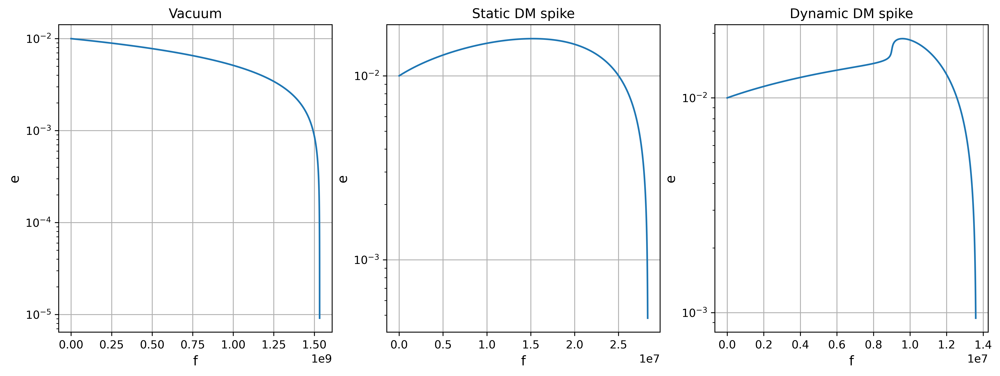

In [90]:
plt.figure(figsize=(15,5))

plt.subplot(131)
plt.title('Vacuum')
plt.plot(f_qc_gw, y_qc_gw[0,:])
plt.xlabel('f')
plt.ylabel('e')
plt.yscale('log')
plt.grid(True)

plt.subplot(132)
plt.title('Static DM spike')
plt.plot(f_qc_static_df_gw, y_qc_static_df_gw[0,:])
plt.xlabel('f')
plt.ylabel('e')
plt.yscale('log')
plt.grid(True)

plt.subplot(133)
plt.title('Dynamic DM spike')
plt.plot(f_qc_dynamic_df_gw, y_qc_dynamic_df_gw[0,:])
plt.xlabel('f')
plt.ylabel('e')
plt.yscale('log')
plt.grid(True)
plt.show()

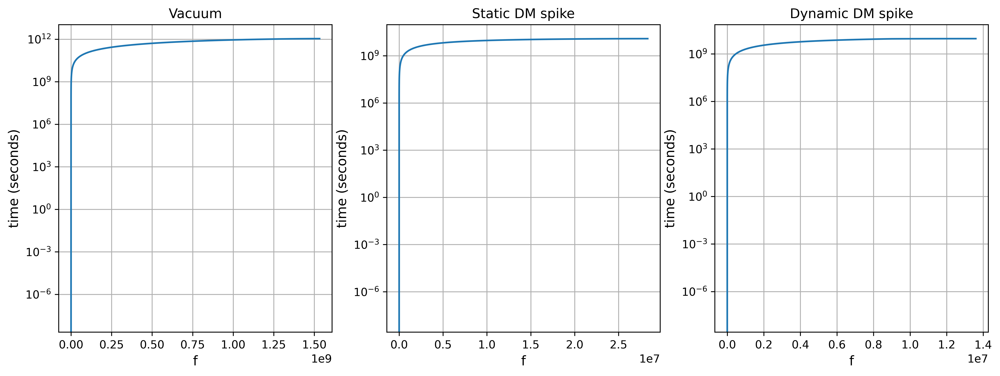

In [91]:
plt.figure(figsize=(15,5))

plt.subplot(131)
plt.title('Vacuum')
plt.plot(f_qc_gw, y_qc_gw[3,:]*t_factor)
plt.xlabel('f')
plt.ylabel('time (seconds)')
plt.yscale('log')
plt.grid(True)

plt.subplot(132)
plt.title('Static DM spike')
plt.plot(f_qc_static_df_gw, y_qc_static_df_gw[3,:]*t_factor)
plt.xlabel('f')
plt.ylabel('time (seconds)')
plt.yscale('log')
plt.grid(True)

plt.subplot(133)
plt.title('Dynamic DM spike')
plt.plot(f_qc_dynamic_df_gw, y_qc_dynamic_df_gw[3,:]*t_factor)
plt.xlabel('f')
plt.ylabel('time (seconds)')
plt.yscale('log')
plt.grid(True)
plt.show()

In [92]:
print(len(f_qc_gw))
print(len(h20_mem_qc_gw))
print(f'h20_mem_qc_gw = {h20_mem_qc_gw[-1]}')
print(f'h40_mem_qc_gw = {h40_mem_qc_gw[-1]}')

4878881
4878881
h20_mem_qc_gw = 1.763652617991737e-21
h40_mem_qc_gw = 1.6970755926547226e-23


In [93]:
print(len(f_qc_static_df_gw))
print(len(h20_mem_qc_static_DF_gw))
print(f'h20_mem_qc_static_DF_gw = {h20_mem_qc_static_DF_gw[-1]}')
print(f'h40_mem_qc_static_DF_gw = {h40_mem_qc_static_DF_gw[-1]}')

90165
90165
h20_mem_qc_static_DF_gw = 3.1883253996546746e-21
h40_mem_qc_static_DF_gw = 3.067971019072044e-23


In [94]:
print(len(f_qc_dynamic_df_gw))
print(len(h20_mem_qc_dynamic_DF_gw))
print(f'h20_mem_qc_dynamic_DF_gw = {h20_mem_qc_dynamic_DF_gw[-1]}')
print(f'h40_mem_qc_dynamic_DF_gw = {h40_mem_qc_dynamic_DF_gw[-1]}')

1352543
1352543
h20_mem_qc_dynamic_DF_gw = 3.0457212597305047e-21
h40_mem_qc_dynamic_DF_gw = 2.930753155011064e-23


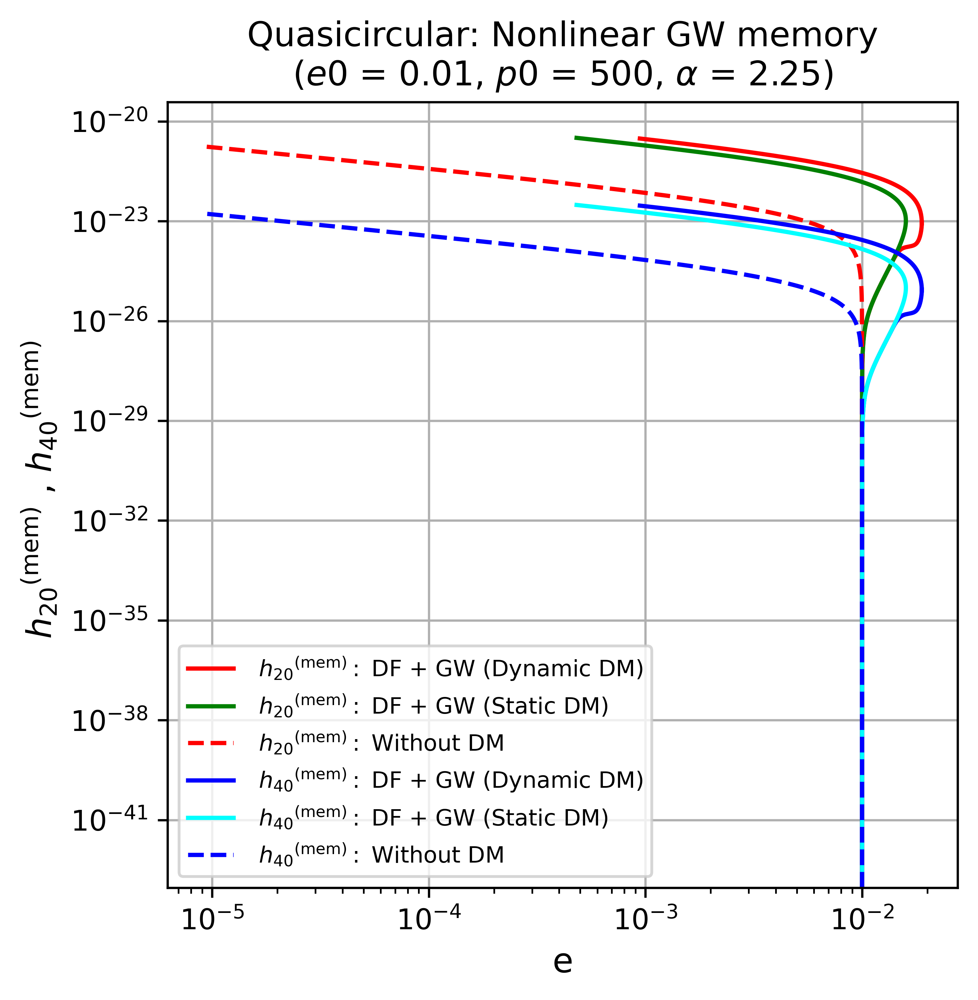

In [95]:
# Quasicircular : Plotting Nonlinear GW memory
plt.figure(figsize=(5,5))
plt.title('Quasicircular: Nonlinear GW memory' +'\n'+ rf'($e0$ = {quasi_e_i}, $p0$ = {quasi_p_i}, '+r'${{\alpha}}$' +f' = {alpha})')

plt.plot( y_qc_dynamic_df_gw[0,:], h20_mem_qc_dynamic_DF_gw, label = r' ${h_{20}}^{\text{(mem)}}:$' +' DF + GW (Dynamic DM)', linestyle='-', color='red' )
plt.plot( y_qc_static_df_gw[0,:], h20_mem_qc_static_DF_gw, label = r' ${h_{20}}^{\text{(mem)}}:$' +' DF + GW (Static DM)', linestyle='-', color='green' )
plt.plot( y_qc_gw[0,:], h20_mem_qc_gw, label= r' ${h_{20}}^{\text{(mem)}}:$' + ' Without DM', linestyle='--', color='red')

plt.plot( y_qc_dynamic_df_gw[0,:], h40_mem_qc_dynamic_DF_gw, label = r' ${h_{40}}^{\text{(mem)}}:$' +' DF + GW (Dynamic DM)', linestyle='-', color='blue' )
plt.plot( y_qc_static_df_gw[0,:], h40_mem_qc_static_DF_gw, label = r' ${h_{40}}^{\text{(mem)}}:$' +' DF + GW (Static DM)', linestyle='-', color='cyan' )
plt.plot( y_qc_gw[0,:], h40_mem_qc_gw, label= r' ${h_{40}}^{\text{(mem)}}:$' + ' Without DM', linestyle='--', color='blue')

plt.xlabel('e')
plt.ylabel(r' ${h_{20}}^{\text{(mem)}}$ , ${h_{40}}^{\text{(mem)}}$')
plt.xscale('log')
plt.yscale('log')
plt.legend(loc='lower left')
plt.grid(True)

# Save as PDF
plt.savefig("elliptical_spike_plot_9.pdf", format="pdf", bbox_inches="tight")

plt.show()

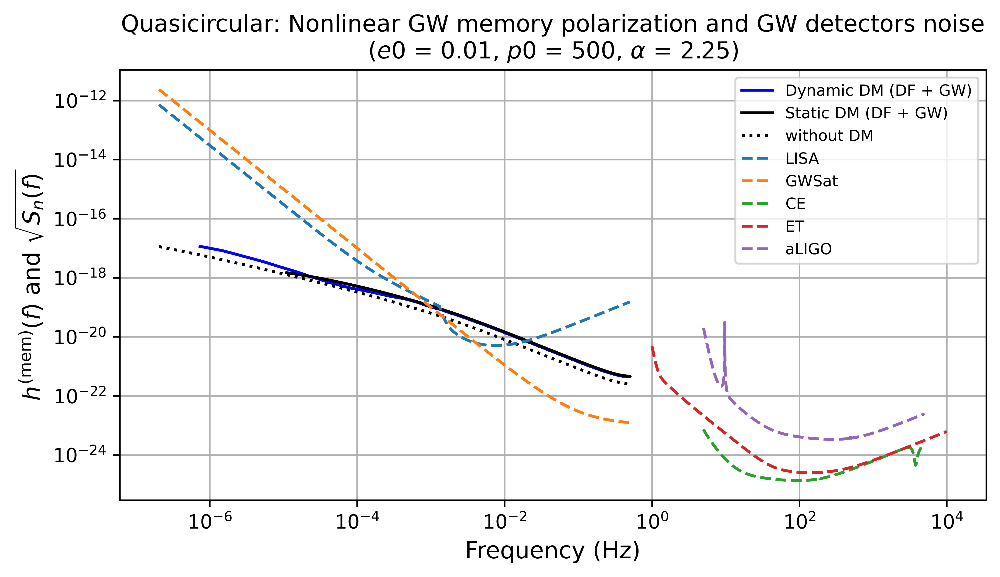

In [96]:
# Quasicircular : Nonlinear memory GW polarization frequency signal without DM (Only GW backrxn)
hp_f_mem_qc_without_DM, pos_freq_qc_without_DM = nonlinear_memory_gw_pol_fft(h20_mem_qc_gw, h40_mem_qc_gw)

# Quasicircular : Nonlinear memory GW polarization frequency signal with STATIC DM (DF + GW)
hp_f_mem_qc_static_DM, pos_freq_qc_static_DM = nonlinear_memory_gw_pol_fft(h20_mem_qc_static_DF_gw, h40_mem_qc_static_DF_gw)

# Quasicircular : Nonlinear memory GW polarization frequency signal with DYANMIC DM (DF + GW)
hp_f_mem_qc_dynamic_DM, pos_freq_qc_dynamic_DM = nonlinear_memory_gw_pol_fft(h20_mem_qc_dynamic_DF_gw, h40_mem_qc_dynamic_DF_gw)

LISA_frequency, LISA_strain = LISA_noise_psd(pos_freq_qc_without_DM, pos_freq_qc_static_DM)  # LISA
GWSat_frequency, GWSat_strain = GWSat_noise_psd(pos_freq_qc_without_DM, pos_freq_qc_static_DM)  # GWsat

# Quasicircular : Plotting Nonlinear memory GW polarization frequency spectrum VS noise PSD of various GW detectors
plt.figure(figsize=(8,4))
plt.title('Quasicircular: Nonlinear GW memory polarization and GW detectors noise'+'\n'+ rf'($e0$ = {quasi_e_i}, $p0$ = {quasi_p_i}, '+r'${{\alpha}}$' +f' = {alpha})')
plt.plot(pos_freq_qc_dynamic_DM, hp_f_mem_qc_dynamic_DM, color='blue',label='Dynamic DM (DF + GW)')
plt.plot(pos_freq_qc_static_DM, hp_f_mem_qc_static_DM, color='black',label='Static DM (DF + GW)')
plt.plot(pos_freq_qc_without_DM, hp_f_mem_qc_without_DM, color='black', linestyle=':', label='without DM')
plt.plot(LISA_frequency, LISA_strain, linestyle='--', label='LISA')
plt.plot(GWSat_frequency, GWSat_strain, linestyle='--', label='GWSat')
plt.plot(CE_frequency, CE_strain, linestyle='--', label='CE')
plt.plot(ET_frequency, ET_strain, linestyle='--', label='ET')
plt.plot(aLIGO_frequency, aLIGO_strain, linestyle='--', label='aLIGO')
plt.xlabel('Frequency (Hz)')
plt.ylabel(r'$h^{\text{(mem)}}(f)$ and $\sqrt{S_n (f)}$')
plt.xscale('log')
plt.yscale('log')
plt.legend(loc='upper right')
plt.grid(True)

# Save as PDF
plt.savefig("elliptical_spike_plot_10.pdf", format="pdf", bbox_inches="tight")

plt.show()